# 第 4 周
3220190783 陈子康

GitHub 地址：https://github.com/czyczk/data-mining-course

In [43]:
import numpy as np
import pandas as pd
from scipy import stats
import matplotlib.pyplot as plt
import operator

In [44]:
# Lib config
plt.rcParams['figure.dpi'] = 300
plt.rcParams['font.sans-serif'] = ['Microsoft YaHei']

## 1. Wine Reviews

In [3]:
# Wine datasets
data_wine_1 = pd.read_csv('./Week_4_Data/Wine/winemag-data-130k-v2.csv', index_col = 0)
data_wine_2 = pd.read_csv('./Week_4_Data/Wine/winemag-data_first150k.csv', index_col = 0)
data_wine_concatted = None
try:
    data_wine_concatted = pd.concat([data_wine_1, data_wine_2], ignore_index = True, verify_integrity = True, sort = False)
except ValueError as e:
    print('ValueError:', e)


###  1.1 数据可视化和摘要
#### 1.1.1 标称属性频数

In [4]:
def calc_frequency(col_data):
    result = dict()
    for item in col_data:
        if item not in result:
            result[item] = 1
        else:
            result[item] += 1
    return result

- `country` 的频数

In [5]:
frequency_country = calc_frequency(data_wine_concatted.country)
for country, frequency in frequency_country.items():
    print("%s: %i" % (country, frequency))

Italy: 43018
Portugal: 11013
US: 116901
Spain: 14913
France: 43191
Germany: 4617
Argentina: 9431
Chile: 10288
Australia: 7286
Austria: 6402
South Africa: 3659
New Zealand: 4739
Israel: 1135
Hungary: 377
Greece: 1350
Romania: 259
Mexico: 133
Canada: 453
nan: 68
Turkey: 142
Czech Republic: 18
Slovenia: 181
Luxembourg: 15
Croatia: 162
Georgia: 129
Uruguay: 201
England: 83
Lebanon: 72
Serbia: 26
Brazil: 77
Moldova: 130
Morocco: 40
Peru: 16
India: 17
Bulgaria: 218
Cyprus: 42
Armenia: 2
Switzerland: 11
Bosnia and Herzegovina: 6
Ukraine: 19
Slovakia: 4
Macedonia: 28
China: 4
Egypt: 4
Albania: 2
Lithuania: 8
Japan: 2
South Korea: 4
Montenegro: 2
Tunisia: 2
US-France: 1


- `province` 的频数

In [6]:
frequency_province = calc_frequency(data_wine_concatted.province)
for province, frequency in frequency_province.items():
    print("%s: %i" % (province, frequency))

Sicily & Sardinia: 4342
Douro: 2356
Oregon: 9962
Michigan: 139
Northern Spain: 8743
Alsace: 4120
Rheinhessen: 558
California: 80755
Mosel: 1824
Other: 1425
Mendoza Province: 8006
Virginia: 1292
Beaujolais: 1576
Colchagua Valley: 2031
Southern Italy: 2788
Maule Valley: 1002
Bordeaux: 12052
Maipo Valley: 1554
Washington: 18389
Central Italy: 2763
Champagne: 2983
Burgundy: 8288
South Australia: 4353
Tejo: 1103
Rapel Valley: 411
Galicia: 958
France Other: 965
Tuscany: 13178
Burgenland: 1436
New York: 5116
Leyda Valley: 398
Piedmont: 7822
Stellenbosch: 1134
Simonsberg-Stellenbosch: 103
Walker Bay: 52
Alentejano: 1809
Central Spain: 1228
Southwest France: 3104
Aconcagua Valley: 310
Loncomilla Valley: 54
Marlborough: 2453
Northeastern Italy: 4120
Casablanca Valley: 1380
Veneto: 6678
Western Cape: 797
Judean Hills: 246
Alentejo: 330
Coastal Region: 413
Rhône Valley: 2399
Galilee: 603
Beira Atlantico: 16
Tokaj: 76
Leithaberg: 48
Santorini: 128
Kremstal: 658
Catalonia: 2516
Recas: 21
Hawke's Bay

#### 1.1.2 数值属性 5 数概括与缺失值个数

In [7]:
class StatsResult:
    """
    Class `StatsResult` is used to store the basic statistics results of a vector / column in a table.
    """
    def __init__(self, length, minimum, maximum, mean, variance, mode, median, q1, q3):
        self.__length = length
        self.__minimum = minimum
        self.__maximum = maximum
        self.__mean = mean
        self.__variance = variance
        self.__sample_variance = variance * length / (length - 1)
        self.__std_dev = np.sqrt(variance)
        self.__sample_std_dev = np.sqrt(self.__sample_variance)
        self.__mode = mode
        self.__midrange = (maximum - minimum) / 2
        # Five-number summary
        self.__median = median
        self.__q1 = q1
        self.__q3 = q3
    
    @property
    def length(self): return self.__length
    
    @property
    def minimum(self): return self.__minimum
    
    @property
    def maximum(self): return self.__maximum
    
    @property
    def mean(self): return self.__mean
    
    @property
    def variance(self): return self.__variance
    
    @property
    def sample_variance(self): return self.__sample_variance
    
    @property
    def std_dev(self): return self.__std_dev
    
    @property
    def sample_std_dev(self): return self.__sample_std_dev
    
    @property
    def mode(self): return self.__mode
    
    @property
    def midrange(self): return self.__midrange
    
    @property
    def median(self): return self.__median
    
    @property
    def q1(self): return self.__q1
    
    @property
    def q2(self): return self.__median
    
    @property
    def q3(self): return self.__q3

In [8]:
def calc_stats(nums):
    """
    Calculates the basic statistics values of a vector / column in a table. Returns a `StatsResult`.
    """
    sorted_nums = sorted(nums)
    mean = np.mean(sorted_nums)
    minimum = sorted_nums[0]
    maximum = sorted_nums[-1]
    q1, median, q3 = np.percentile(sorted_nums, [25, 50, 75])
    median = np.median(sorted_nums)
    mode = stats.mode(sorted_nums)[0][0]
    variance = np.var(sorted_nums)
    return StatsResult(len(nums), minimum, maximum, mean, variance, mode, median, q1, q3)

- `points` 的 5 数概括

In [9]:
stats_result_points = calc_stats(np.array(data_wine_concatted.points.dropna()))
print('最小值：%g' % stats_result_points.minimum)
print('q1：\t%g' % stats_result_points.q1)
print('中位数：%g' % stats_result_points.q2)
print('q3：\t%g' % stats_result_points.q3)
print('最大值：%g' % stats_result_points.maximum)

最小值：80
q1：	86
中位数：88
q3：	90
最大值：100


- `points` 缺失值个数

In [10]:
data_wine_concatted.points.isna().sum()

0

- `price` 的 5 数概括

In [11]:
stats_result_price = calc_stats(np.array(data_wine_concatted.price.dropna()))
print('最小值：%g' % stats_result_price.minimum)
print('q1：\t%g' % stats_result_price.q1)
print('中位数：%g' % stats_result_price.q2)
print('q3：\t%g' % stats_result_price.q3)
print('最大值：%g' % stats_result_price.maximum)

最小值：4
q1：	16
中位数：25
q3：	40
最大值：3300


- `price` 缺失值个数

In [12]:
data_wine_concatted.price.isna().sum()

22691

### 1.2 数据可视化

> **注：**
此小节以下图中均将缺失数据作剔除处理。

#### 1.2.1 直方图

- `points` 直方图

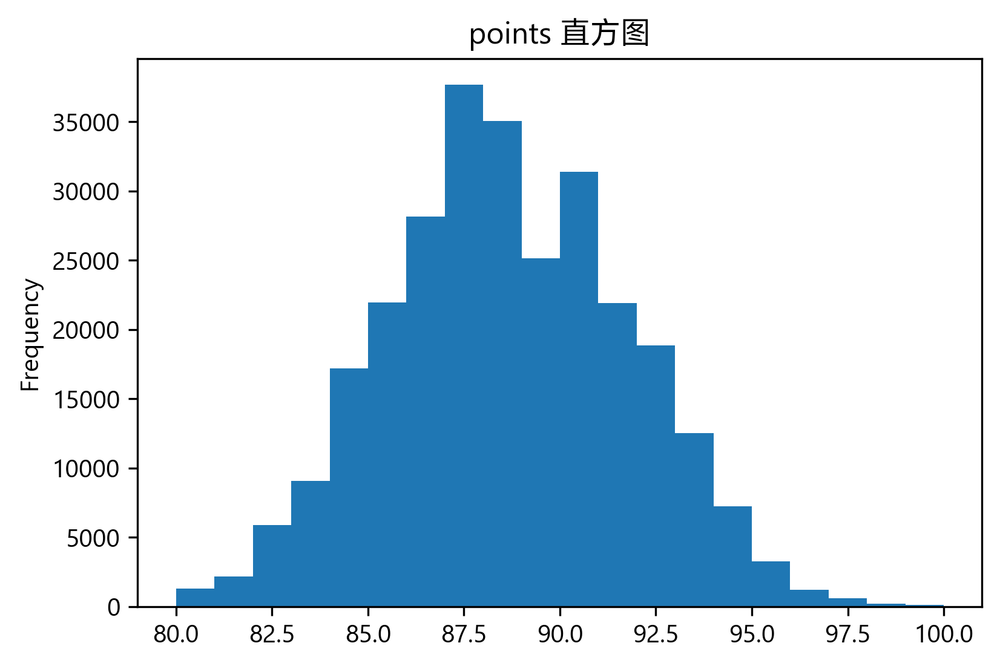

In [13]:
data_wine_concatted.points.dropna().plot.hist(bins = 20, title = 'points 直方图')

- `price` 直方图

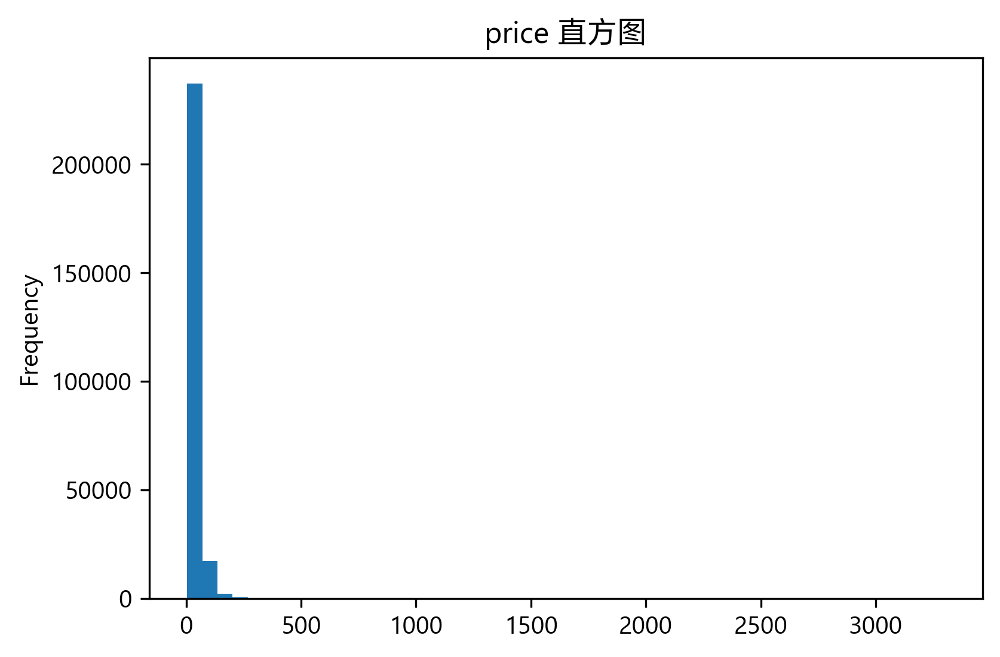

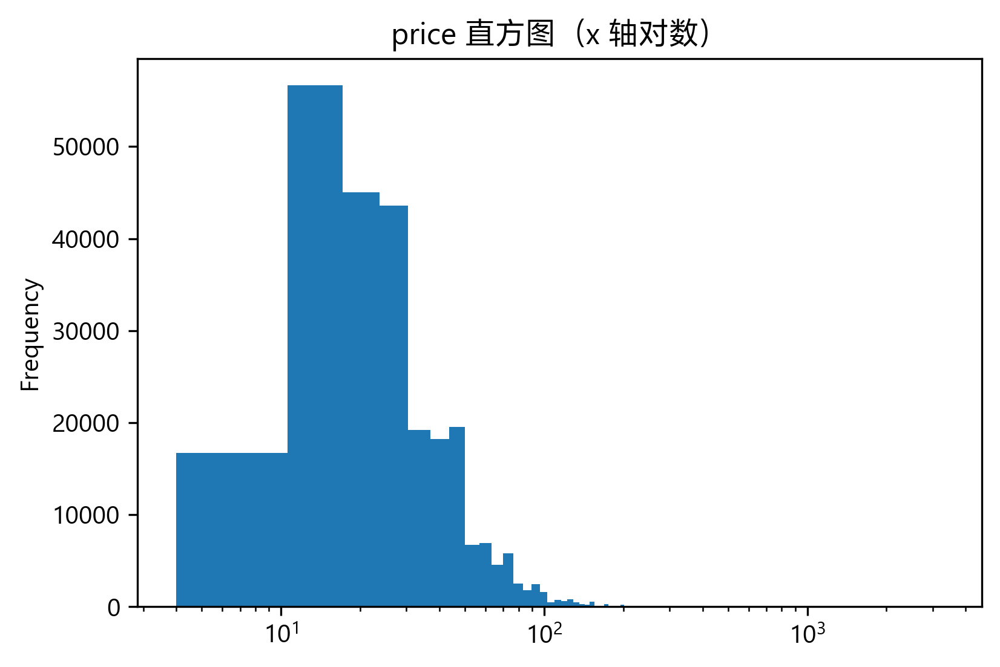

In [14]:
data_wine_concatted.price.dropna().plot.hist(bins = 50, title = 'price 直方图')
plt.show()
data_wine_concatted.price.dropna().plot.hist(bins = 500, title = 'price 直方图（x 轴对数）', logx = True)

#### 1.2.2 盒图

- `points` 盒图

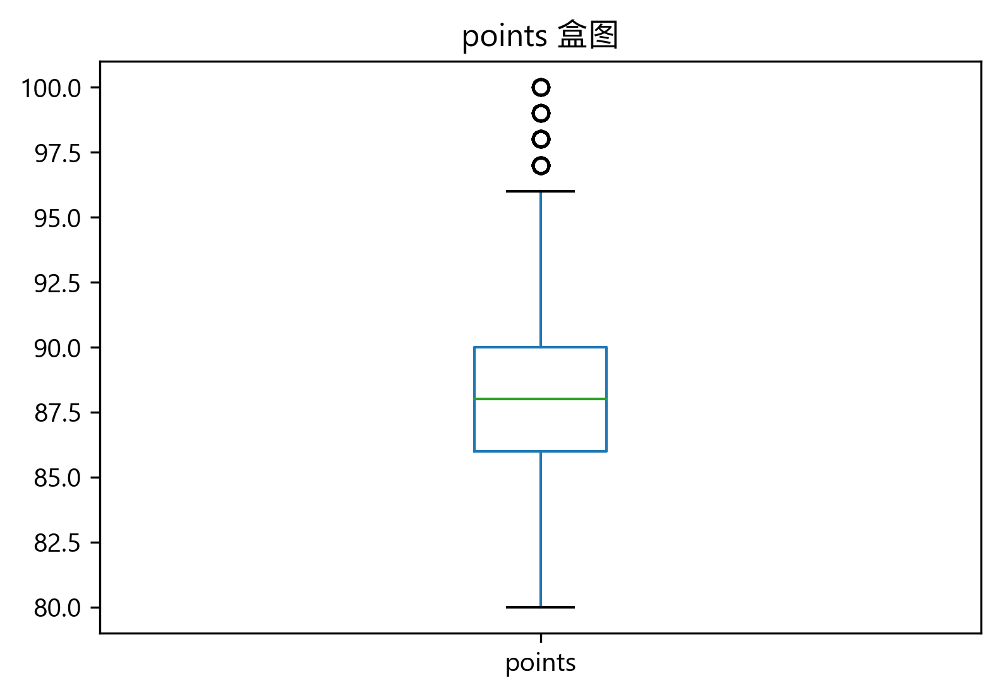

In [15]:
data_wine_concatted.points.dropna().plot.box(title = 'points 盒图')

- `price` 盒图

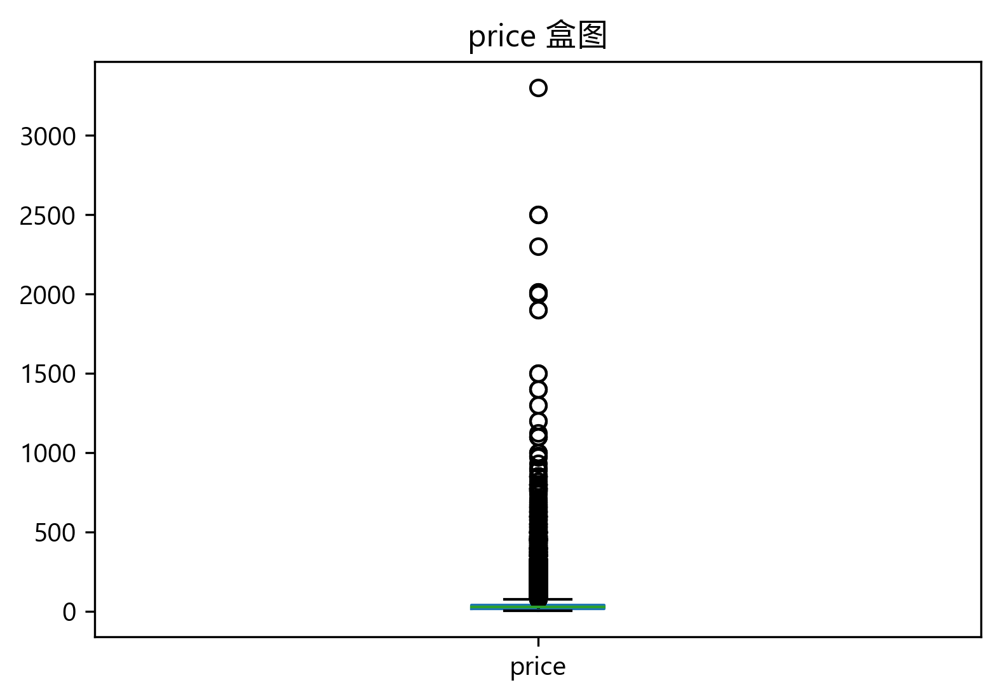

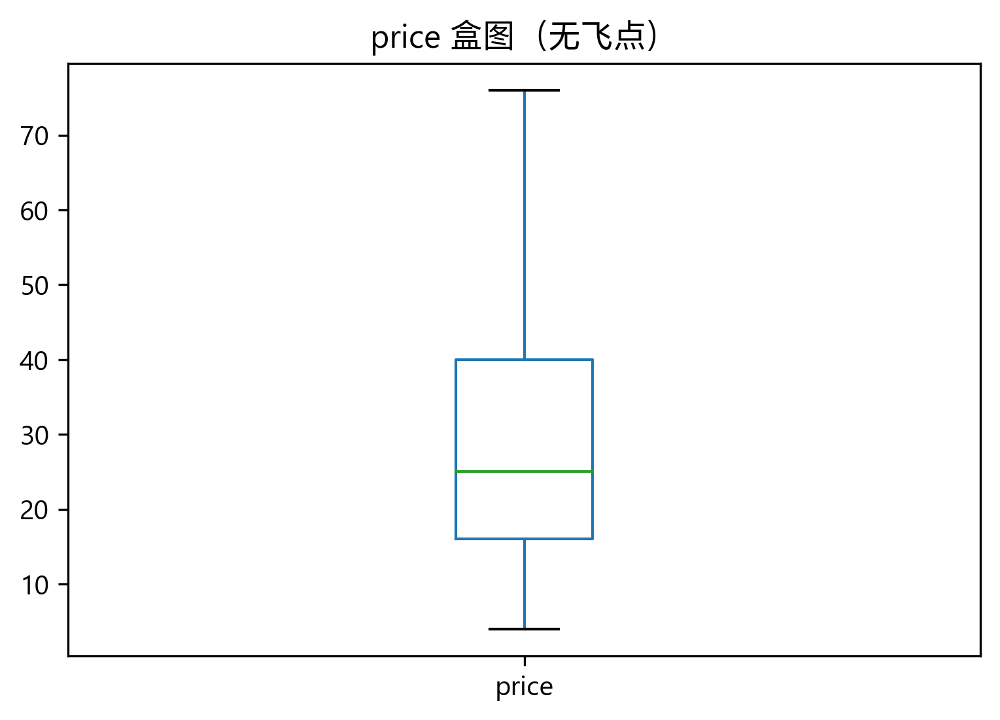

In [16]:
data_wine_concatted.price.dropna().plot.box(title = 'price 盒图')
plt.show()
data_wine_concatted.price.dropna().plot.box(title = 'price 盒图（无飞点）', showfliers = False)

### 1.2 数据缺失的处理


该数据集中品酒师给出的分数 `points` 没有缺失，而酒的价格 `price` 缺失较多。原因可能是酒的价格不统一、变动大，或是采样时未采集该项数据。

#### 1.2.1 填充值的计算

**最高频率值**即 `price` 属性的唯一众数。

In [17]:
mode_price = stats.mode(data_wine_concatted.price.dropna())
# `stats_result_price` is calculated previously. `stats_result_price.mode` == `mode_price[0][0]`
print('price 众数个数：%i，值为 %g。' % (len(mode_price[0]), stats_result_price.mode))

price 众数个数：1，值为 20。


**属性相关关系：**选取另一个数值属性 `points` 计算属性的相相关关系，计算这两个属性的余弦相似度与 Pearson 相关系数。

In [18]:
data_wine_points_price_known_rows = data_wine_concatted[['points', 'price']].dropna()
data_wine_points_price_unknown_rows = data_wine_concatted[['points', 'price']].query('price != price')

In [19]:
def calc_cosine_similarity(vec_1, vec_2):
    """
    Calculates the cosine similarity of two vectors.
    """
    dot_product = np.dot(vec_1, vec_2)
    vec_1_norm = np.linalg.norm(vec_1)
    vec_2_norm = np.linalg.norm(vec_2)
    return dot_product / (vec_1_norm * vec_2_norm)

In [20]:
cosine_price = calc_cosine_similarity(data_wine_points_price_known_rows.points, data_wine_points_price_known_rows.price)
pearson_price = data_wine_points_price_known_rows.corr().points.price
print('points 与 price 的余弦相似度：%g。' % cosine_price)
print('points 与 price 的 Pearson 相关系数：%g。' % pearson_price)

points 与 price 的余弦相似度：0.674102。
points 与 price 的 Pearson 相关系数：0.437456。


虽然相关系数不是特别高，但作为剩下唯一可用的数值属性，只能使用它来拟合关系。下面使用最小二乘法来似合这两个属性的关系。

In [21]:
def calc_least_square_method_coefficients(vec_x, vec_y):
    """
    Calculates the coefficients of the linear regression function using the least square method for two vectors.
    The result coefficients `a` and `b` can be applied as "y=a+bx" for prediction.
    """
    n = len(vec_x)
    dot_product = np.dot(vec_x, vec_y)
    mean_x = np.mean(vec_x)
    mean_y = np.mean(vec_y)
    squared_norm_x = np.dot(vec_x, vec_x)
    
    b = (dot_product - n * mean_x * mean_y) / (squared_norm_x - n * mean_x * mean_x)
    a = mean_y - b * mean_x
    return (a, b)

In [22]:
lsm_a, lsm_b = calc_least_square_method_coefficients(data_wine_points_price_known_rows.points, data_wine_points_price_known_rows.price)
print('最小二乘法得到的拟合函数为 y = %gx%g。' % (lsm_b, lsm_a))

最小二乘法得到的拟合函数为 y = 5.35233x-437.283。


**对象相似性：**

构建相似性矩阵，从矩阵中选取相似度最高的对象，采用其 `price` 属性的值作为填充值。
在与 `price` 属性相关的所有属性中，标称属性包含 `country`、`province`、`region_1`、`region_2`、`variety` 和 `winery`；数值属性包含 `points`。对这两部分分别采用对应的公式对距离进行计算后，按这两部分的属性个数加权混合作为两个对象之间的距离。

In [23]:
def calc_object_similarities_for_data_wine():
    """
    Calculates the object similarities for the objects in the dataset "Wine" with missing attribute of `price`.
    **IMPORTANT:** Don't invoke this unless you have 39.008056 days to waste.
    """
    distances_of_missing_rows = [] # It will be a 2-dimensional array storing tuples of (row_index, min_distance). The first tuple for the first missing row and so on...
    distance_related_nominal_attributes = ['country', 'province', 'region_1', 'region_2', 'variety', 'winery']
    distance_related_numeric_attributes = ['points']

    for i, cur_row in data_wine_concatted.iterrows():
        # Skip the rows/objects with normal values of `price`
        if cur_row.price == cur_row.price:
            continue

        distances_to_jth_row = []

        # Calculate the distance from the current row/object to the j-th row/object
        for j, target_row in data_wine_concatted.iterrows():
            # Add a distance of infinity in the case where i == j to prevent itself from being selected as the most similar object
            if i == j:
                distances_to_jth_row.append(float('inf'))

            # Add an NaN for the rows with an NaN `price`
            elif target_row.price != target_row.price:
                distances_to_jth_row.append(float('NaN'))

            else:
                # Calculate the distance for the nominal attributes (NaNs contribute to mismatches)
                match_count = 0
                for nominal_attr in distance_related_nominal_attributes:
                    if cur_row[nominal_attr] == target_row[nominal_attr]:
                        match_count += 1
                distance_nominal_attributes = (len(nominal_attr) - match_count) / len(nominal_attr)

                # Calculate the distance (Euclidean distance) for the numeric attributes
                distances_numeric_attributes = []
                for numeric_attr in distance_related_numeric_attributes:
                    distances_numeric_attributes.append(
                        np.linalg.norm(cur_row[numeric_attr] - target_row[numeric_attr])
                    )
                distance_numeric_attributes = sum(distances_numeric_attributes) / len(distance_related_numeric_attributes)

                # Calculate the weighted distance
                distance_weighted = (
                    distance_nominal_attributes * len(distance_related_nominal_attributes) +
                    distance_numeric_attributes * len(distance_related_numeric_attributes)
                ) / (len(distance_related_nominal_attributes) + len(distance_related_numeric_attributes))

                distances_to_jth_row.append(distance_weighted)

        distances_of_missing_rows.append((distances_to_jth_row.index(min(distances_to_jth_row)), min(distances_to_jth_row)))
        return distances_of_missing_rows

In [24]:
# The method is provided above but should not be invoked unless you have 39.008056 days to waste.
#calc_object_similarities_for_data_wine()
## The length of `distances_of_missing_rows` should be == the length of `data_wine_points_price_unknown_rows`
#assert(len(distances_of_missing_rows) == len(data_wine_points_price_unknown_rows))

以上提供了关于对象相似度的计算方法，但是由于这是个时间复杂度为 $n^2$ 级别的计算（假设 `price` 未知的条目数量为 $n$），在本台实验机上预计需要 39.008056 天，无法实现，故后续的比较中将略过使用对象相似度填充值这一项。

#### 1.2.2 应用填充值

In [27]:
# This cell can take about 15s to run
price_filled_with_mode = data_wine_concatted.price.copy(deep = True).fillna(stats_result_price.mode)
price_filled_with_mode.rename('price_filled_with_mode')
price_filled_with_lsm_estimates = []
for i in range(len(data_wine_concatted)):
    if data_wine_concatted.price[i] != data_wine_concatted.price[i]:
        price = lsm_b * data_wine_concatted.points[i] + lsm_a
        price_filled_with_lsm_estimates.append(price)
    else:
        price_filled_with_lsm_estimates.append(data_wine_concatted.price[i])
price_filled_with_lsm_estimates = pd.Series(price_filled_with_lsm_estimates)
price_filled_with_lsm_estimates.rename('price_filled_with_lsm_estimates')


0         28.37021
1         15.00000
2         14.00000
3         13.00000
4         65.00000
            ...   
280896    20.00000
280897    27.00000
280898    20.00000
280899    52.00000
280900    15.00000
Name: price_filled_with_lsm_estimates, Length: 280901, dtype: float64

In [28]:
# Check if all the NaNs have been successfully filled
assert(data_wine_concatted.price.isna().sum() != 0) # Make sure the original data is not affected
assert(price_filled_with_mode.isna().sum() == 0)
assert(price_filled_with_lsm_estimates.isna().sum() == 0)

#### 1.2.3 可视化比较

> **注：**
下列对比图中，对缺失值的作不同处理方法的结果按如下顺序展示：
- 左上：将缺失部分剔除
- 右上：用最高频率值来填补缺失值
- 左下：通过属性的相关关系来填补缺失值
- 右下：通过数据对象之间的相似性来填补缺失值

- `price` 直方图

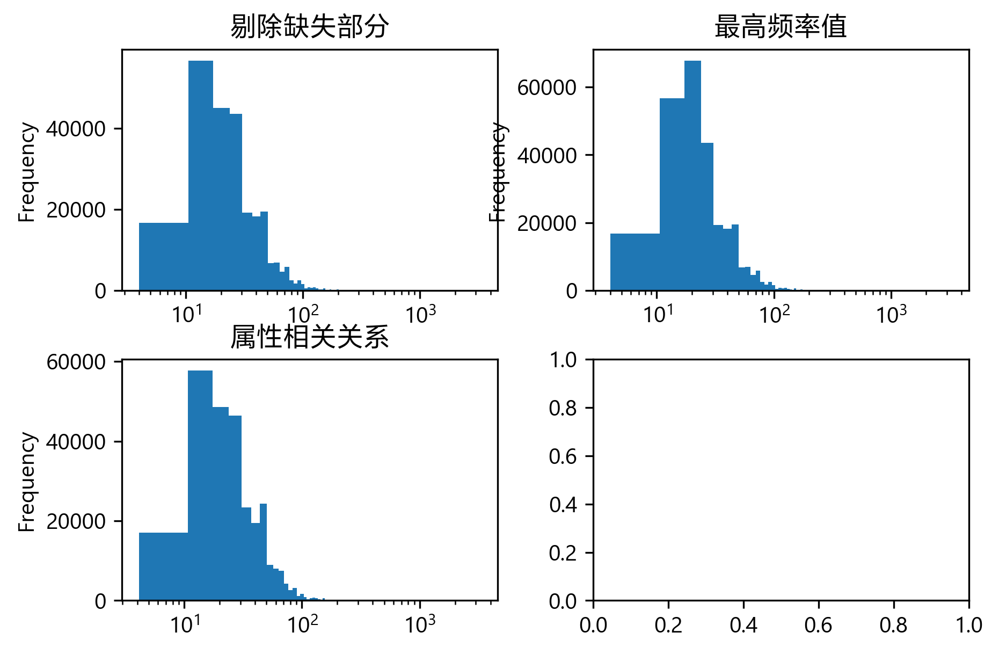

In [34]:
fig, axes = plt.subplots(nrows = 2, ncols = 2)
fig.tight_layout()
data_wine_concatted.price.dropna().plot.hist(bins = 500, title = '剔除缺失部分', logx = True, ax = axes[0, 0])
price_filled_with_mode.plot.hist(bins = 500, title = '最高频率值', logx = True, ax = axes[0, 1])
price_filled_with_lsm_estimates.plot.hist(bins = 500, title = '属性相关关系', logx = True, ax = axes[1, 0])

- `price` 盒图

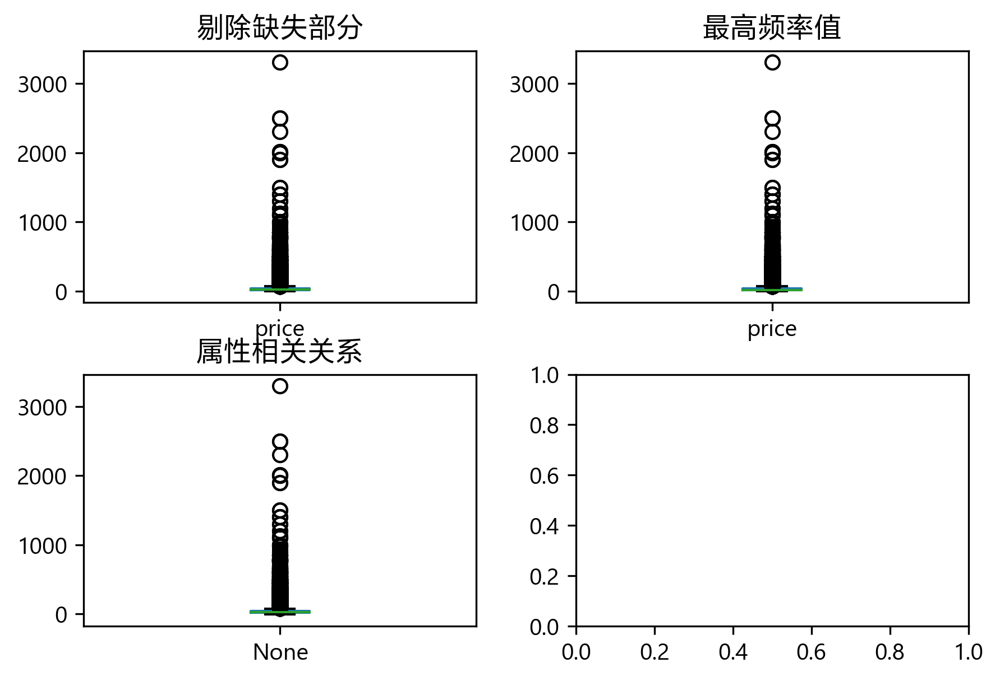

In [36]:
fig, axes = plt.subplots(nrows = 2, ncols = 2)
fig.tight_layout()
data_wine_concatted.price.dropna().plot.box(title = '剔除缺失部分', ax = axes[0, 0])
price_filled_with_mode.plot.box(title = '最高频率值', ax = axes[0, 1])
price_filled_with_lsm_estimates.plot.box(title = '属性相关关系', ax = axes[1, 0])

- `price` 盒图（无飞点）

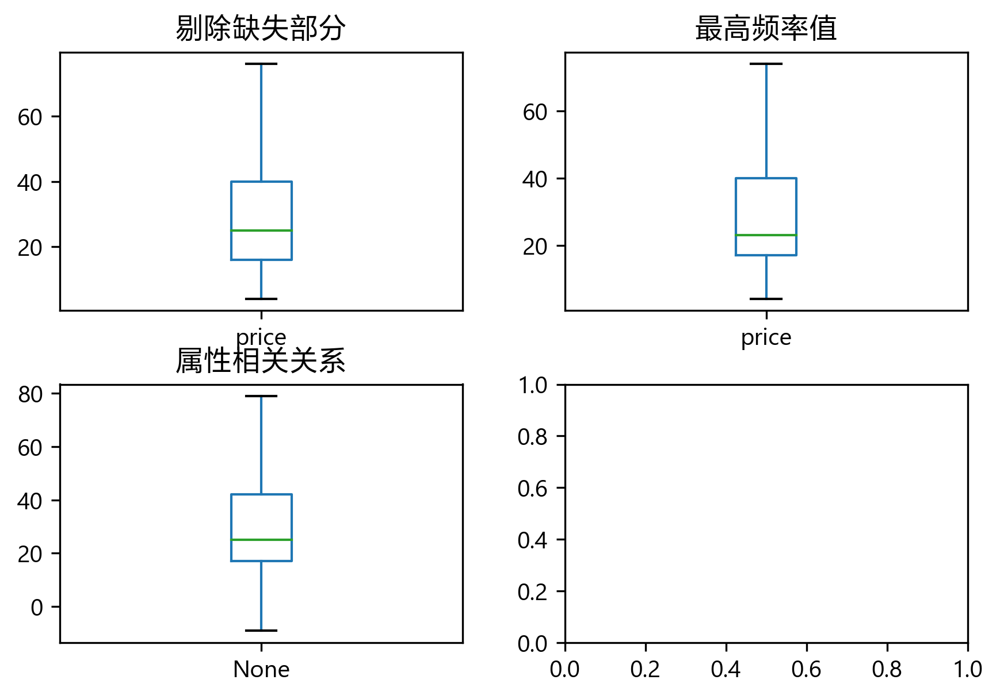

In [37]:
fig, axes = plt.subplots(nrows = 2, ncols = 2)
fig.tight_layout()
data_wine_concatted.price.dropna().plot.box(title = '剔除缺失部分', showfliers = False, ax = axes[0, 0])
price_filled_with_mode.plot.box(title = '最高频率值', showfliers = False, ax = axes[0, 1])
price_filled_with_lsm_estimates.plot.box(title = '属性相关关系', showfliers = False, ax = axes[1, 0])

# 2. Trending Youtube Video Statistics

In [41]:
# Youtube datasets
data_ytb_01 = pd.read_csv('./Week_4_Data/Youtube/CAvideos.csv', index_col = 0)
data_ytb_02 = pd.read_csv('./Week_4_Data/Youtube/DEvideos.csv', index_col = 0)
data_ytb_03 = pd.read_csv('./Week_4_Data/Youtube/FRvideos.csv', index_col = 0)
data_ytb_04 = pd.read_csv('./Week_4_Data/Youtube/GBvideos.csv', index_col = 0)
data_ytb_05 = pd.read_csv('./Week_4_Data/Youtube/INvideos.csv', index_col = 0)
data_ytb_06 = pd.read_csv('./Week_4_Data/Youtube/JPvideos.csv', index_col = 0, engine = 'python')
data_ytb_07 = pd.read_csv('./Week_4_Data/Youtube/KRvideos.csv', index_col = 0, engine = 'python')
data_ytb_08 = pd.read_csv('./Week_4_Data/Youtube/MXvideos.csv', index_col = 0, engine = 'python')
data_ytb_09 = pd.read_csv('./Week_4_Data/Youtube/RUvideos.csv', index_col = 0, engine = 'python')
data_ytb_10 = pd.read_csv('./Week_4_Data/Youtube/USvideos.csv', index_col = 0)
data_ytb_list = [data_ytb_01, data_ytb_02, data_ytb_03, data_ytb_04, data_ytb_05, data_ytb_06, data_ytb_07, data_ytb_08, data_ytb_09, data_ytb_10]
data_ytb_concatted = None
try:
    data_ytb_concatted = pd.concat(data_ytb_list, ignore_index = True, verify_integrity = True, sort = False)
except ValueError as e:
    print('ValueError:', e)

###  2.1 数据可视化和摘要
#### 2.1.1 标称属性频数

- `channel_title` 频数

In [47]:
frequency_channel_title = {
    k: v for k, v in sorted(
        calc_frequency(data_ytb_concatted.channel_title).items(),
        key = lambda item: item[1],
        reverse = True)}
for channel_title, frequency in frequency_channel_title.items():
    print("%s: %i" % (channel_title, frequency))

The Late Show with Stephen Colbert: 984
WWE: 804
Late Night with Seth Meyers: 773
VikatanTV: 763
TheEllenShow: 743
Jimmy Kimmel Live: 707
The Tonight Show Starring Jimmy Fallon: 705
PewDiePie: 652
RadaanMedia: 651
The Late Late Show with James Corden: 583
CNN: 579
Netflix: 566
FBE: 555
MLG Highlights: 549
SET India: 528
Screen Junkies: 494
ESPN: 486
Marvel Entertainment: 482
BuzzFeedVideo: 481
Warner Bros. Pictures: 470
Çukur: 466
REACT: 457
5-Minute Crafts: 453
20th Century Fox: 432
Saturday Night Live: 429
Vox: 427
SMTOWN: 426
CollegeHumor: 407
Elhiwar Ettounsi: 405
Breakfast Club Power 105.1 FM: 404
SAB TV: 404
Good Mythical Morning: 397
CinemaSins: 396
Philip DeFranco: 395
The Daily Show with Trevor Noah: 387
WIRED: 386
Анатолий Шарий: 383
Dude Perfect: 374
THIRU TV: 372
The View: 353
atv: 343
CaseyNeistat: 340
Universal Pictures: 338
T-Series: 336
Tasty: 336
The Voice: 336
Россия 24: 329
Sony Pictures Entertainment: 329
First We Feast: 328
Speed Records: 320
ibighit: 320
Flowers C

Marvel Studios Movies: 41
Carl is cooking: 41
الخاوة ـ القناة الرسمية: 41
Kanatsız Kuşlar: 41
Payitaht Abdülhamid: 41
1in.am LIVE: 41
Константин Ответственный X: 41
Le Sport avec CANAL: 41
Politique Francaise 2: 41
Durendal1: 41
2CELLOS: 41
LadBaby Official: 41
johnlegendVEVO: 41
Top Telugu Media: 41
YOYO TV Kannada: 41
FactTechz: 41
Rose Telugu Movies: 41
Studio Sangeeta: 41
Fischer's-フィッシャーズ-: 41
TBS公式 YouTuboo: 41
TOMIKKU NET 2nd CH: 41
タケヤキ翔: 41
, 허준선생TV: 41
양팡 YangPang: 41
MKTV 김미경TV: 41
Alfonso León: 41
Financial Mentors TV - Español: 41
TeleTomas: 41
Indie Arts Kenel: 41
El Nopal Times: 41
Verdad Oculta: 41
Все по полочкам: 41
EvoNeon FIFA: 41
Яковлев Миша: 41
Alex Vikodinov: 41
宇哥讲电影: 40
Toronto Maple Leafs: 40
Best Pakistani Dramas: 40
Funny Vines: 40
Film Companion: 40
Zero Media: 40
SB-LII Commercials: 40
Mark Ferris: 40
truTV: 40
QPark: 40
2ChainzVEVO: 40
MBN News: 40
FRANCE 24: 40
Sma Al Fan Production International سما الفن الدولية للإنتاج: 40
RTL2: 40
IDJVideos.TV: 40
Yo

StrangerThanFiction: 20
리얼 스토리TV: 20
chadnisha: 20
BrettYoungVEVO: 20
Hamtaro Gasa: 20
X22Report: 20
Speak For Yourself with Cowherd and Whitlock: 20
Kenny Sebastian: 20
Vallie Foulk: 20
STX Entertainment: 20
YGVEVO: 20
Power 106 Los Angeles: 20
GermanLetsPlay: 20
Wanted Adventure: 20
Zvezde Granda Specijal: 20
Herşey Dahil: 20
Seda ve Uğur'la: 20
Azzlackz: 20
Comedy & Satire im Ersten: 20
freekickerz: 20
Kalbimdeki Deniz: 20
ArkivaShqip: 20
Русское Кино: 20
Mercedes-Benz Deutschland: 20
JSL Global Media: 20
Fard: 20
HATICE MAZI: 20
Only Afghan: 20
Live From Earth: 20
Robert Franz: 20
MBC مصر: 20
DRUCK - Die Serie: 20
КиноТВ: 20
TV جديد اليوم: 20
robert 87000: 20
Road to Saiyan: 20
GREED: 20
JEREMSTAR: 20
Volmog 16: 20
SFR Sport: 20
DZ akhbar: 20
Buzz News: 20
TOP 14 - Officiel: 20
Georgette Mag: 20
jOsSpace: 20
La Boîte à Questions: 20
Passion Slime: 20
Dzair 24: 20
Djadja & Dinaz: 20
Gossip Téléréalité: 20
Demi Lovato: 20
adidas Football: 20
The Deal Guy: 20
HelloOctoberxo: 20
Will D

MAX ПОЯСНИТ: 13
MENTAL TV: 13
Elena Matveeva: 13
Red Lamp: 13
Отель Элеон: 13
Политика Россия - Украина: 13
Семья В селе: 13
Максим Старосвитский: 13
лиззка: 13
Dasha Koshkina: 13
Алёна Венум: 13
Правовед ТВ: 13
Dead Dynasty: 13
Кэшбери: 13
Агния Огонек: 13
ВЕСТНИК АПОКАЛИПСИСА: 13
Мастер Сергеич: 13
BagaBoom: 13
УСЫ ЛАПЫ И ХВОСТ: 13
Yeni Kanal: 13
Канал Не Тормози: 13
Сергей Николаевич Лазарев: 13
BobCat ТВ: 13
Афоня TV: 13
PostNews: 13
чебурашка это мышь: 13
POLITICS GLOBAL: 13
Дальнобой-Life David KAMAZ: 13
АНТИПОНТ: 13
Julia Lanske: 13
Жасмина Рахимова: 13
navo.tv: 13
NHL Россия: 13
KG TUBE MEDIA CHANNEL: 13
ЧОЛПОН ТВ: 13
Добрые советы: 13
LecraeVEVO: 13
devinsupertramp: 13
WE tv: 13
Business Insider UK: 13
WHAT'S INSIDE? FAMILY: 13
Everyday Astronaut: 13
Kris Harbour: 13
Zach King: 13
oregon: 13
Warped Perception: 13
BrainfooTV: 13
JOE.ie: 13
Matthew Hussey: 12
ChrisFix: 12
CrashRacing: 12
Pick Up Limes: 12
Mingjing Huopai: 12
Victoria's Secret: 12
Hollyscoop: 12
BTS Videos: 12
AL

MYM ALK4PON3: 9
Vivir Sano: 9
Stranger Things en Español: 9
Joserra el Rey IX El Original: 9
Jesus Adrian Romero: 9
LinaMechaz: 9
007hernyvideos: 9
Nezah: 9
KL videos: 9
MakiCute: 9
MultiPepelon: 9
Sabor Pati: 9
Elecktrofe2: 9
LAF Producciones: 9
Pelicomic: 9
A la Yugular Noticias: 9
JukiLop: 9
Lyna: 9
F. A.A.: 9
letty Bernal: 9
Extraordinary Emiliano: 9
Kpop Asian Sub: 9
Estrellas del Ring: 9
AtuLadoEsMejor: 9
Alma Maestra Espiritual: 9
Un Mini Show: 9
Antonio Portillo: 9
ZellenDust - REY DEL TERROR Y EL ABSURDO: 9
Traian Ionel Glavan: 9
Katia Nabil: 9
platica polinesios: 9
El Cardenal Gasdas: 9
RemmyValenzuelaVEVO: 9
No TV: 9
Tú Comentario... en Mi Deporte: 9
Nath Campos: 9
Chico Coreano: 9
mideportemx: 9
MTVLA: 9
footballlivestreamhd: 9
Duki: 9
EL RASTRO: 9
SportsHD: 9
Monick Perez: 9
Edd00chan & MrDsaster INC: 9
3.186.368 ditonton: 9
DeTodoUnPoco MX: 9
Noticias Lutteo: 9
NVT CHANNEL: 9
Alejandro Zúñiga EN VIVO: 9
FANATICO SIMPSON: 9
Prensa Libre tv: 9
Дом-2 Новости с Джулией: 9
Jam

Solfa: 6
LyricalHub: 6
BICH PHUONG: 6
BurnsVEVO: 6
Tommy Ross: 6
JP Channel: 6
MusicFans: 6
Top 5s Supreme: 6
The Voice Legendary: 6
Meghan Markle & Prince Harry News: 6
قناة الظفرة: 6
102.7KIISFM: 6
Goofy Dough: 6
FalzVEVO: 6
Quality Control Music: 6
Mastu: 6
Wrzzer: 6
Catch Em All Fishing: 6
Zig & Sharko: 6
CoryxKenshin: 6
maxmoefoetwo: 6
Omer Menashe: 6
Song Lin: 6
HYPEX: 6
2018 BTS FESTA: 6
Corridor: 6
Summoner's Inn: 6
Wargaming Europe: 6
DER AKTIONÄR TV: 6
Mulumbi DerModerator: 6
BEST OFF: 6
Mein Grundeinkommen: 6
The Voice of Germany - Offiziell: 6
Rubinio B & Quater's Rubin B: 6
HOLISTISCH GESUND - Benjamin Weidig: 6
RAW Akademie: 6
Tokio Hotel: 6
Las Fierbinti Sezonul 12: 6
ruthe.de: 6
Kai aus Hannover: 6
newsleak: 6
Manda: 6
officialcasperxo: 6
MagicBiber: 6
Sibbershusum: 6
NEMAGIA: 6
NizarComedy: 6
Zeitgeist & Politik: 6
Fishing-King: 6
RedeFabrik - Kommunikation & Charisma: 6
Khaled Bozan: 6
Zec+ Nutrition: 6
Storyful News: 6
ZDFtivi: 6
M1Molter - Der Heimwerker: 6
Die drei

Приколы TV: 5
Флуффи: 5
Марифания: 5
Hoang Guan: 5
Ларин Против: 5
Лучшие Инставайны: 5
По-Братски: 5
ПУШЕР: 5
MARKOV: 5
Pastime Time: 5
AhtubaTV: 5
Leon Weinstein: 5
Skrip Skrep: 5
СПЕЦ: 5
MARFFA: 5
YuliKa: 5
Фильмы Навсегда: 5
Популярные видео: 5
КоЛена Гадание на Любовь: 5
Ярослав Брин: 5
Quad Theory: 5
Anna Chi DIY: 5
ASMR Tanya Shayk: 5
Очкастый Задрот: 5
vanzai: 5
Irina Yasinskaya: 5
Magic Pets: 5
Comics Lab: 5
Julia Efimova: 5
Anna Garyaeva: 5
Знай Больше: 5
Amazon.co.uk: 5
officer401: 5
Ben Rohrbach: 5
D3sports.com: 5
emma chamberlain: 5
Summit: 5
Movie Munchies: 5
Cody'sLab Backup: 5
Big Cat Rescue: 5
Philadelphia 76ers: 5
TimandFaithVEVO: 5
MisterWivesVEVO: 5
Voicebot: 5
The Sports King: 5
John Sellars: 5
Royal Academy of Arts: 5
Tina Nguyen: 5
Darren Criss: 5
legofreedom1: 5
Loudwire: 5
Apple Support: 5
HQVideoDude: 5
Feelunique: 5
Galantis: 5
JamesAVEVO: 5
European Space Agency, ESA: 5
Big Ten Network: 5
FILMWEBTV: 5
Syracuse Orange: 5
Marteen Estevez: 5
leonalewis: 5
greys

#SobreVivoEnGuerrero: 4
Doc Files: 4
Monje Loma: 4
Sin tu Mirada: 4
WorldMusic TV: 4
Spinning Out: 4
EnamorandonosPlus❤: 4
Koco Polinesio: 4
Universal Camera: 4
Colegio de Imagen Pública: 4
Lia Garske: 4
Amazon Prime Video Mexico: 4
El Mundo del Espectaculo: 4
Momentos DIYvertiDOLLS*: 4
The Coaster Zone: 4
Personajes México: 4
Ricky Velázquez: 4
EVY LINARES: 4
Ideas en 5 minutos CHICAS: 4
Picadillo TV: 4
Senen Sad: 4
Cocinando con El Salvador 4K: 4
Marino Sifuentes A.: 4
La Voz Kids España: 4
Vida Real: 4
Distroller: 4
Noticias del Clavel rojo: 4
Kassandra Gomez: 4
TVnovelas CG: 4
Dartz Soryu: 4
Swalla: 4
Bandas Mix: 4
ORJuanAlejandro - YouTube: 4
gigi22i channelTwo: 4
T13: 4
Quesadilla de Verdades: 4
Jacobo Lara: 4
SPITMX: 4
La Verdad: 4
Canal 44: 4
Gonzok: 4
David Silva: 4
Trend Central: 4
Chismes Enamorandonos VIP: 4
DC Kids Latino: 4
Paint Coffe: 4
Cinema Clips: 4
toofacedcosmetics: 4
ADN Opinión: 4
YoutuberChinto: 4
señor nota: 4
FOBOS PLANET: 4
EL SEÑOR DE LOS CIELOS 5TA TEMPORAD

Flying Dog: 3
B.LEAGUE: 3
SNOW GARDEN: 3
carolina de cristofaro: 3
room My hobby: 3
のびのびチャンネル: 3
Mario Colors Army Game For Kid: 3
ブラックロゼドラゴンボール考察: 3
Awakening Ch: 3
Ai Sakuranbo: 3
LIVE SHOW: 3
CygamesChannel: 3
Henshin TV: 3
7th youtube channel: 3
KPOP IDOLS 러브!: 3
GPS LOVE: 3
ノギレコ!暇つぶしTV: 3
elekashiofficial: 3
Anime PONY CANYON: 3
1着予想: 3
グッとくるチャンネル: 3
言論テレビ: 3
k ikemoto: 3
緑黄色社会: 3
King Drama: 3
KBSEntertain: 3
mike ishikawa_No.2: 3
スカッとした修羅場が好き。: 3
Mnet Japan: 3
張景富: 3
気になるウワサチャンネル: 3
論客道場: 3
もこうの実況: 3
happyvoltex 新次元で生きよう!: 3
さぼりｃｈ: 3
Daily Soccer: 3
概要欄TV: 3
韓国ニュース ワウコリア: 3
BiS 新生アイドル研究会 official channel: 3
パンの袋のアレ: 3
環境省COOL CHOICE 動画チャンネル: 3
くるり: 3
Laughing Game: 3
utubojb23: 3
KaoJapan: 3
레디[Freddy]튜브TV 프: 3
髪西: 3
shouwa aki: 3
Brad number: 3
カール: 3
WOWOWofficial: 3
考察芸能: 3
クレイジージャーニー crazyjourney: 3
sanriojapan: 3
THEカラオケ★バトル（THE KARAOKE BATTLE）: 3
OfficeAugusta: 3
usataniうさたにパイセン/ギャルの教科書: 3
芸能リポートちゃんねる: 3
大倉くんと高橋くん: 3
koara koara: 3
もちひよこ: 3
VISSEL KOBE: 3
abemaofficial: 3


3분이면 충분해: 3
ヽ(〃v〃)ノ ♪♪: 3
멋여우: 3
제이: 3
Once정인: 3
xMarchtwentieth: 3
날라리데이브!: 3
Laura Padilla: 3
IDOL LOVE: 3
국제축구: 3
Rednose: 3
알펀티비: 3
Mochi Peach: 3
멜롱이 _: 3
TV Korean basketball: 3
Y Time 구독부탁해요: 3
Blue Milky: 3
집회태극기: 3
노래 자막 모음: 3
the spring home 더스프링홈: 3
Patricia Official: 3
유 ki: 3
공식원스: 3
Ruby Poppy: 3
뷔글소년단: 3
영상천국: 3
새싹쿱: 3
Best Harrold: 3
[ 뀨블리 ] 뀨유: 3
최애돌합시다아아 청춘: 3
sally 샐리: 3
namja12four: 3
꼬불하개파마 Curly Pup Perma: 3
사이다 TV: 3
민주주의 3.0: 3
문 썰tv: 3
뱃츄: 3
돌 이의 각설이 TV 복: 3
Netflix Korea: 3
전희경과 자유의 힘: 3
嵐 쬐끄: 3
돌발 정치르포: 3
sydneytoyou: 3
ssangssangbar tube v.2: 3
WWPW: 3
ok jolicos: 3
S J: 3
Sugafull 27: 3
반응 TV: 3
해외안테나: 3
터닝메카드 - turning mecard official: 3
와빌: 3
한국NEWS: 3
김나예: 3
Adam Kiefer: 3
월정이의채널: 3
스페셜솔져 - 모바일FPS: 3
리뷰엉이북스: 3
[이나경] 아디: 3
엣겜채널: 3
이집사 STUDIO: 3
개토리: 3
JellyBinn: 3
이자요이미쿠: 3
상만 BJ: 3
NEWS 24/7: 3
HONG's studio: 3
TeamKabeto: 3
카랑Karang: 3
GuardiAngel 가디언젤: 3
나는야댓글러: 3
각별 TV: 3
이슈와반응 issue&reaction: 3
라이프 정보이슈: 3
KBS VIEW: 3
ssoon X 2: 3
이포스트: 3
TV얄개: 3
NEW

Kuschel: 2
YOUCAR: 2
Tausend Sassa Tirol: 2
Kickbox: 2
Maç Özetleri Türkiye 2: 2
أخبار كرة القدم ❶: 2
Football Fans: 2
Thermifee: 2
SRF Musik: 2
Chili Chopstickz: 2
Simion Sechsundachtzig: 2
PublicoMag: 2
Liquidhimmel: 2
Lina & Lisa: 2
Acne Treatment: 2
Barış Özcan: 2
der tim: 2
Bonnytrash: 2
Björn Hünxe: 2
kinofilme: 2
Senioren Zocken: 2
Aida Doci Official: 2
Anna Maria Damm: 2
HEIMKINORAUM: 2
Marvin Hörner [LB GARAGE]: 2
ismail Necdetoğlu: 2
ViBio: 2
ERI Beats: 2
Roswita Rühl: 2
Hamza Namira Official: 2
Payet Sport: 2
Star Wars News: 2
Lina: 2
Kampfkunst Lifestyle: 2
Schacht & Wasabi: 2
Dizi Sahneleri: 2
rappers.in: 2
ASMRJanina: 2
Schloss Webstein: 2
alpi: 2
Survivor Türkiye: 2
فيروزيات الضيعة AN: 2
MEGALOMAN: 2
Çukur Fans: 2
V KINGS: 2
Обзоры Фильмов: 2
Mr. Blue: 2
B3nny: 2
До Встречи: 2
ZAPP - Das Medienmagazin: 2
DACH PRO: 2
Freedom Lenny TiGr: 2
كورة وبس: 2
T.I.W Music: 2
Magazin Kazanı: 2
Deli Havadis: 2
SparkofPhoenix2: 2
2645 Records: 2
ZDF wiso: 2
One Piece Theoretiker / One

LOVESTRUCK: 2
Donna Faye Loayon: 2
야호두야: 2
애니클립 channel: 2
자유 NET: 2
하얀여우: 2
secret_dawn 은밀한새벽: 2
Official fromis_9: 2
KONI MIRE: 2
티비하이라이: 2
KoreAnnyeong: 2
mdy 112263: 2
俺達の満足: 2
JokerSolstice: 2
이멋진세계에: 2
스파하는하원 [YOUTUBE]: 2
Areli777: 2
Lea CouCou: 2
쵸파TV - 원피스 토론 채널: 2
BeryVery: 2
정치 뉴스 업데이트: 2
Aylin Coşkun: 2
ไฮไลท์จัดเต็ม& เมสซี่ ชาน: 2
HankyorehTV: 2
Le Quynh: 2
두루마리: 2
always gd: 2
SAMSEARN OFFICIAL: 2
매거진 탑 뉴우스: 2
KBO BASEBALL TV: 2
짐니1: 2
CJESJYJ: 2
뉴 스 핫: 2
Max Imperium: 2
소녀전선 공식 채널: 2
G 민: 2
궁금한이야기: 2
1등 번호 주는 Numberer. K: 2
TV 어그로: 2
dugo j: 2
Cyphers 사이퍼즈: 2
KPOPVIRALZ: 2
AutoCast 오토캐스트: 2
아라리와 유쾌한 친구들: 2
Junior J.S: 2
FFAN: 2
JU.H JU: 2
dja12121212: 2
Bunny Wink: 2
영상도네용: 2
Hoai Pham: 2
뉴스큐브: 2
라이언스튜디오: 2
張 大漢SNSD十周年: 2
Red Velvet Updates: 2
Chandler Louis: 2
강원도민TV: 2
Samsung Electronics: 2
PlayIN Play: 2
Y hoony: 2
beniah blanding: 2
CelebNews: 2
MY MASAKI: 2
트위치조아: 2
807호실: 2
구름 하: 2
쥰 쥰: 2
Bogumfeel _: 2
ODS: 2
한국 TV: 2
DOTV KOREA [이수현]: 2
Xiutiful B: 2
New TV: 2
la

Мишень в дым: 2
МихейTUBE: 2
ЛПХ Кубик: 2
VSE42 Ru: 2
OverGames: 2
Room Factory LIVE: 2
Екатерина Комарова: 2
ПРИКОЛЫ И ЗАСВЕТЫ ПЕРИСКОПА: 2
Последние новости 24H: 2
LORDAN Play: 2
Александр Жестков: 2
Anna Ceres Bar: 2
Домашнее: 2
АТН новости Беларуси и мира: 2
ЭмДжей: 2
Мс Ой Всё: 2
flamieFF: 2
DANIIL K1M: 2
strikerperm: 2
ВРЕМЯ: 2
Реальный Факт: 2
КОМЕДИАНТ: 2
SanGraf: 2
CSGO TOURNAMETS - RUS: 2
Svetlana K: 2
ЛОЖЬ на ТВ: 2
Райден: 2
Йошкин Кот: 2
Анастасия Жданова: 2
Сергей Домогацкий: 2
Yuriy: 2
Nikita Belyanin: 2
Forcado NEWS: 2
КГБлог: 2
Байки Митяя: 2
Хочу Жить: 2
Neutral News: 2
Farik ʕ ᴖᴥᴖ ʔ: 2
Костя Белый: 2
М 605: 2
Золотой: 2
Komissarov . DS: 2
Антон Долгих: 2
Сергей Ощепков: 2
Платим Кредит. Суровые Будни: 2
Вольнов Talks: 2
Актуальный Путин: 2
LIFE ONLINE: 2
Телекомпания ТВ2: 2
MARDONG-PALAS: 2
Заветы Каутского: 2
RELIFE: 2
Мария Соколова: 2
Uz MUSIQA TV: 2
Morflex TV: 2
Великая Россия: 2
Михаил Алфёров Кемерово: 2
Mr Tigasim: 2
Alter Animations: 2
I ❤ MUSIC: 2
Пожар в Ке

Freie Presse: 1
Haikel: 1
Mister Q: 1
DaSchienenfresser: 1
Unwetter24.net: 1
Textmarcer: 1
nollywoodbest: 1
BTB-concept: 1
Dortmund24: 1
David Behringer - Bewusster Leben: 1
Franja Himmelspach: 1
Leaving the Frame: 1
Offizieller Pokémon Youtube Kanal: 1
Ul Sch: 1
Tristanowitsch: 1
Kerem TV: 1
report-K / Internetzeitung Köln: 1
Goldfinger200: 1
Der Westreporter: 1
BOCHUMSCHAU: 1
FAI Sailplane Grand Prix: 1
Julia Engelmann: 1
Ich bin ein Star - Holt mich hier raus: 1
RAPOLUTION: 1
iMeteo.sk: 1
dZ KryG: 1
Raketenbaum: 1
Scott G. Overend: 1
Natürlich Anna: 1
PΛTRIOT: 1
rannius: 1
LuuBear Sport: 1
natix: 1
dicht & ergreifend: 1
Hans Knauß: 1
Old Films and Stuff: 1
Berlin TV: 1
Marco Kern: 1
Livemedia: 1
Made My Dream: 1
ITS Mitchell PLAYz: 1
Καθαρή Δύναμη 3: 1
Schattenwolf: 1
Vodzup Games: 1
Sports Center: 1
Carina Spoon: 1
Fraktion DIE LINKE. im Bundestag: 1
Real Skreips: 1
Şifreli Kanal: 1
BasSTOP: 1
Film Rulosu: 1
TR VİDEO HABER: 1
pilotmadeleine: 1
Ses Deneme 123: 1
Gerçeğin ta kendisi:

Frederic Delavier: 1
Mon Petit Reflex: 1
buzzovore: 1
JulietteArmanetVEVO: 1
Max En Parle: 1
Y'a tout ici hein: 1
Sophie Riche: 1
Racing Channel: 1
XADJAFOULE TV: 1
zeroundersteer: 1
général Lj: 1
René Leperche: 1
FLORIAN PHILIPPOT: 1
Exeno TV: 1
Puy du Fou: 1
Nat Geo France: 1
Survie en Nature: 1
Nicolas Aubin: 1
Marius Chasse: 1
Said InLife: 1
La Minute Spatiale: 1
Parrot TV: 1
CamaraProductionTV: 1
Reptiligne: 1
xalass l’officiel: 1
RAPVVS: 1
LV3D: 1
anoASMR: 1
RatePi: 1
heuss lenfoire: 1
INSTA BUZZ: 1
Short Goals: 1
BIGTYME PRO: 1
Bramsito Music: 1
Voltor63: 1
Section Pull Up Officiel: 1
Shiu Li: 1
Le Sorcier De Serpentard: 1
SciencesPoLilleTV: 1
Sama Camera: 1
Squadra Officiel: 1
jdv 972: 1
Chaillot Barnabé: 1
XSOO: 1
La Persévérante Le Mans - Gymnastique: 1
Sportalios TV: 1
Samara: 1
Maxime Grandjean: 1
Lazghost2 -: 1
LaChaineDeGoul': 1
MzK1337: 1
ASWATTSTUDIOCHANNEL: 1
FootballReviewsHDQ: 1
Asmeki Speech: 1
Flaco10: 1
Ace: 1
Arnaud THIRY: 1
MediaKooraHD-TV+3: 1
WildMight: 1
Just

立憲民主党: 1
自由党: 1
URAN KARA: 1
あかほねライダー: 1
kuwa eyoki: 1
TOYOTAHOMEchannel: 1
sizu sizu: 1
気になる!2chの芸能情報!: 1
逆襲のトカゲぶちょー: 1
【公式】96NEKO-SUB-CHANNEL: 1
channel Bun: 1
natso otako: 1
XiDEA ch: 1
MZ: 1
さんさんmama: 1
日南テレビ!: 1
Animenist Loverukotan: 1
平野歩夢チャンネル: 1
Brian James: 1
스윗박스: 1
奈良テレビチャンネル: 1
芸能ゴシップBar: 1
ダルちゃんねる: 1
Manga One: 1
おいしいチャーハン: 1
ネムシ: 1
の木檸檬: 1
バイバイキーング: 1
Angela Ciarrochi: 1
Li Hane: 1
虚拟DD: 1
HapiHapi: 1
Sports Station TV: 1
877-MAN since 2017: 1
バナナマンファミリー: 1
ンジョン US TV: 1
Koolbin ABi: 1
sumi asai: 1
Manga One Piece: 1
駄犬ギンのチャンネル: 1
HONG KONG: 1
秒速で億り人 資産10億円トレーダーSHUN: 1
とある漢のチャンネルもこう: 1
Anime Elly: 1
バイクル: 1
Calvin T. Taylor: 1
うにちゃんねる: 1
東京日報youtube支社: 1
クロムサファリ: 1
Super Taikyu TV: 1
Charles Cade: 1
mappy 0818: 1
名無しの権兵衛: 1
tamayamaz: 1
スピリチュアル動画: 1
考察ジャンピング: 1
30second clip: 1
Jason Harrell: 1
ジャンプチ広報局（ジャンプチ ヒーローズ公式）: 1
Knoxy Al: 1
Chocolate House SEIJIN チョコレートハウスSEIJIN: 1
Châu Khải Phong: 1
三井不動産: 1
Ly Hanser: 1
SagaKai Generation: 1
ぽちのDIYチャンネル: 1
七原: 1
Miyako Sayaka:

El hombre Tabano: 1
WORLD SPORT MX: 1
Pasion al futbol mx: 1
iFoot7: 1
Jesus Sanchez: 1
Alito Gameplays: 1
Anime 21: 1
BuckerBuck: 1
Hip Rap: 1
Zona_Blaugrana: 1
SoyFernandaBlaz: 1
URBAN CREW: 1
Nelly Suárez: 1
El Vago 97: 1
Nathaniel FD: 1
L Punto: 1
Mezcladito 07: 1
Ladrones de Palomitas: 1
djcobramusica TV: 1
Justin Barraza: 1
Su Excelencia Gowasu :v: 1
RSHighlights: 1
Sarah Silva: 1
Memes Fut - SRG App: 1
OrigenEX: 1
Framalat: 1
Futbol y Curvas: 1
MagicEstudio: 1
Alex MeGu: 1
Nic Fan: 1
Historia de Autos en Mexico: 1
Psico Vlog: 1
zigoperu: 1
Ank show: 1
TV FOX: 1
Mario Rodriguez: 1
Autos y Mas: 1
NOTICIAS EN ESPAÑOL: 1
ThascyaVEVO: 1
Juan Zavaleta. La Conspiración de la Verdad: 1
juan carlos lopez: 1
Fuera De Lugar Transmisiones: 1
Lotov: 1
Sashü Giménez: 1
Club De Lulutubers: 1
1983chente: 1
Irma Veronica Flores Flores: 1
VeroSweetHobby: 1
Fut al Dia Mx: 1
Miraculous Ladybug Latino: 1
El Espectador: 1
1UP: 1
Dayton Modderman: 1
GlAdys Guzman: 1
En Ocasiones Veo Haters: 1
Conexion

Younjosh: 1
Liubov Kiev: 1
camobodia kubota: 1
artlebedevstudio: 1
BIGRAJ STUDIO: 1
Topcheapdrone: 1
Блоги Точикон: 1
HTH4nsk: 1
Atoev Huseyn: 1
Анастасия Бельская: 1
GaMeRsViLLe: 1
The Bombay Talkies Studios: 1
Russian Films FullHD: 1
БАРАНДАЁК Ю: 1
Mr Virus: 1
АудиоОбзоры СМИ_ру: 1
Pubtune Records: 1
Sprayground: 1
taj hype: 1
Разгадки истории: 1
Deen Squad: 1
ISTINA: 1
Kapitan Kenguru: 1
50djs50states: 1
BOTAY.COM: 1
Castelofunk.com Official: 1
Desi Beats Records: 1
Pim van Mierlo: 1
The Wolf Of Bitcoin: 1
Красноярские новости: 1
Crimea Bridge: 1
Greedier Social Media: 1
МИР БОКСА: 1
Дом 2 Вечен: 1
Anabel Cat: 1
Filipp Lomov: 1
Принцесса ❤: 1
Desi Shreyam: 1
♫НеаДекват Records♫: 1
Channels Media: 1
НОВЫЕ БОЕВИКИ 2016.: 1
Bucket Hildre: 1
nô mercy: 1
Rhyz The Gamer: 1
Loshadka Balerina: 1
Ooredoo Oman: 1
Video Game News: 1
Racing Entertament: 1
CAM PRANKS live: 1
Миссия Dawah: 1
Winter Sports: 1
Amaki Hockey: 1
SPD Creativity: 1
voice of hearts: 1
ПАРТИЯ ГОЛОС РЕГИОНОВ: 1
Союз Вкладч

MenqHayenq TV: 1
Баяр Барадиев: 1
ГЕННАДИЙ ГОЛОВКИН - Официальный канал 2018: 1
Эдо Барнаульский: 1
Tolibjon Safarov: 1
Cheesem: 1
Oleg Fiksa: 1
TOJIKON 2018: 1
7Holidays: 1
Vanilka Show: 1
GoldenBurst: 1
Mr. Moment Inc: 1
Asyk aMan: 1
QAZSPORT TV: 1
Поповская Ольга: 1
ЭЛВИС: 1
Reg Show: 1
НокауЧ: 1
Павел Хохловский: 1
Холостяк: 1
Volnov Live: 1
Murazor TV | World of Tanks: 1
GREBENNIKOV WRESTLING CHANNEL: 1
Против цензуры: 1
Лучшие новости 2018HD: 1
Дизайн кухни и интерьер: 1
Наташа Шелягина: 1
GDTster: 1
FreeOniz: 1
Ka Re: 1
Типичный Чистополь: 1
Fun-N-Cam studio©: 1
ВЕСТИ КОТ: 1
Mikola Khymchuk: 1
Николай Николаевич: 1
TacticMedia: 1
HitSadTV: 1
Midnight Caller: 1
ГТРК Новосибирск: 1
FILMSTER: 1
smotraTV: 1
Wedding video: 1
Вадим Поляк: 1
h0s Tube: 1
Виктор Блуд: 1
Zheka Fatbelly: 1
Maclad1888: 1
Kairat TV: 1
HenaranAkumb: 1
Людмила Заграфская: 1
Красивые поздравления и подарки на Youtube.: 1
İdris Koçovalı: 1
Best Player: 1
Видеоблог Надежды Костиной: 1
Телеканал «Оплот ТВ»: 1
plag

- `tags` 频数

In [ ]:
frequency_tags = {
    k: v for k, v in sorted(
        calc_frequency(data_ytb_concatted.tags).items(),
        key = lambda item: item[1],
        reverse = True)}
for tag, frequency in frequency_tags.items():
    print("%s: %i" % (tag, frequency))

[none]: 37698
шарий|"шарий блог"|"новое видео шарий"|"шарий новое"|"анатолий шарий"|"шарий анатолий"|"ifhbq"|"видео шария"|"толя шарий": 353
The Late Show|"Stephen Colbert"|"Colbert"|"Late Show"|"celebrities"|"late night"|"talk show"|"skits"|"bit"|"monologue"|"The Late Late Show"|"Late Late Show"|"letterman"|"david letterman"|"comedian"|"impressions"|"CBS"|"joke"|"jokes"|"funny"|"funny video"|"funny videos"|"humor"|"celebrity"|"celeb"|"hollywood"|"famous"|"James Corden"|"Corden"|"Comedy": 341
Vaani rani|"rani"|"Radhika in funny character"|"venu aravind"|"SunTV"|"VaniRani"|"vani"|"vaani"|"Radhika's dual role serial"|"Ranimma veetu kuripu"|"Radhika as lawyer in serial"|"radikaa"|"rathika"|"Radhika's new": 313
flowers tv|"uppum mulakum"|"uppum"|"biju sopanam"|"Balanchandran"|"Neelima"|"juhi rustagi"|"flower tv comedy"|"flower tv malayalam"|"balanchandran"|"entertainment"|"best comedy serial malayalam"|"s p sreekumar"|"college campus comedy"|"marimayam"|"sneha sreekumar"|"programme"|"moosa

Talking|"kitty"|"cat"|"black cat"|"stevecash83"|"Sylvester"|"Gibson"|"Shelby"|"Random kitty"|"Talking kitty cat"|"talking cat"|"cute"|"kitten": 16
Lenarr|"Lenarr Young"|"Lennar"|"LenarrYoung"|"Lenar"|"Lanarr"|"Young"|"Skit"|"Skits"|"Comedy": 16
Laura88Lee|"dos and donts"|"how to apply false lashes"|"makeup do's and don'ts"|"makeup mistakes to avoid"|"do's and don'ts"|"false lashes"|"mistakes"|"makeup hacks"|"lashes"|"makeup donts"|"false eyelashes"|"makeup dos and donts"|"eyelashes"|"makeup mistakes"|"mascara"|"how to"|"do's"|"common makeup mistakes"|"how to apply"|"eyeshadow dos and donts"|"false lashes for beginners"|"fake lashes"|"laura lee"|"do and dont": 16
mathew knowles|"beyonce"|"solange knowles"|"jay-z"|"wendy williams"|"the wendy williams show"|"#youtubeblack": 16
todos los goles y resumen completo|"全ゴール&実況ハイライト"|"Alle Tore & Highlights mit Kommentar"|"Tous les Buts et moments forts"|"جميع الأهداف و ملخص المباراة بالتعليق"|"所有入球及精華評述"|"Alle mål og høydepunkter kommentar"|"tut

電視劇|"大陸電視劇"|"风筝"|"谍战"|"柳云龙"|"罗海琼"|"李小冉"|"马驰"|"liuyunlong"|"luohaiqiong"|"lixiaoran"|"machi": 10
Gulaebaghavali Songs|"Gulaebaghavali Movie"|"Gulaebaghavali Tamil Movie"|"Gulaebaghavali Full Movie"|"Gulaebaghavali Teaser"|"Gulaebaghavali Trailer"|"gulebakavali Songs"|"gulebakavali Movie"|"gulebakavali Tamil Movie"|"gulebakavali Full Movie"|"Gulaebaghavali New Movie"|"gulebagavali": 10
samhini 1212|"مسلسل سامحيني"|"2m"|"2mtv"|"tv2m"|"soread"|"soread maroc"|"maroc"|"morocco"|"2m replay"|"2m tv maroc live en direct"|"قناة دوزيم": 10
Celebrities Lifestyle|"new years eve day"|"new year's eve"|"new years eve 2018"|"new years eve events"|"new year"|"new year party"|"new years eve ideas"|"new year party 2018"|"new years eve party"|"london new years eve 2018 new years eve 2018 events"|"Dubai New Year's Fireworks 2018"|"Fireworks 2018"|"Dubai New Year's Fireworks": 10
новогодний квартал|"вечерний квартал"|"квартал 95"|"95 квартал"|"новый квартал"|"владимир зеленский"|"новогодний выпуск"|"новый го

やすとものどこいこ!: 9
BandaiNamcoHoldings|"BandaiNamco"|"NamcoBandai"|"バンダイナムコ"|"ナムコ"|"バンダイJapan"|"Toy"|"Anime"|"Gundam"|"トイ玩具"|"おもちゃ"|"アニメ"|"ガンダム"|"特撮": 9
つるなか|"UFOキャッチャー"|"クレーンゲーム"|"UFOキャッチャー攻略"|"UFOキャッチャー裏技"|"クレーンゲーム攻略"|"クレーンゲーム裏技"|"ラウンドワン"|"モーリーファンタジー"|"確率機"|"くじキャッチャー"|"詐欺"|"乱獲"|"店員": 9
ハイサイ探偵団|"沖縄"|"釣り"|"ハイサイ"|"ドッキリ"|"スペースデリバリー"|"ワールドキッチン"|"ワールドクッキング"|"過酷"|"サバイバル"|"巨大魚"|"魚"|"高級魚": 9
お笑い|"おもしろ"|"面白い"|"バカ"|"相馬トランジスタ"|"へきほー"|"ヘキホー"|"バカ侍"|"ネタ"|"ザビア"|"カワグチ"|"ジン": 9
西宮市|"立川市"|"野田市"|"春日部市"|"練馬区"|"春日部市議会議員選挙"|"練馬区議会選挙"|"NHKをぶっこわす"|"都議会"|"都議会議員選挙"|"NHKをぶっ壊す"|"ＮＨＫからの大切なお知らせ"|"都知事選挙"|"東京都知事"|"東京都知事選挙"|"参議院"|"参議院選挙"|"市議会議員"|"市議"|"全国比例"|"参議院全国比例"|"NHK会長"|"チャンネル桜"|"NHK党"|"国民を守る"|"NHKから国民を守る党"|"NHKから国民を守る"|"池上彰"|"受信料拒否"|"受信料不払い"|"電通"|"立花孝志"|"NHK"|"NHK受信料"|"受信料裁判"|"NHK拒否"|"受信料解約"|"時効"|"受信料時効"|"時効５年"|"日本放送協会放送放送受信規約"|"地域スタッフ"|"集金人"|"ＮＨＫ解体"|"内部告発"|"週刊文春"|"イラネッチケイ"|"イラネッチケー"|"NHK徴収料"|"NHK裁判判決"|"受信料裁判判決"|"受信料判決"|"受信料特別対策センター"|"NHK解約"|"NHK不払い"|"衆議院総務委員会"|"ＮＨＫ撃退"|"ＮＨＫ相談"|"ＮＨＫ迷惑"|"政見放送"|"ＮＨＫ調停"|"ワンセグ"|"ワンセグ裁判"|

слепаков|"семенслепаков"|"comedy"|"comedyclub"|"камеди"|"камедиклаб"|"дудь"|"вдудь"|"юрийдудь"|"бард"|"интервью"|"бардовскаяпесня"|"сатира"|"нашараша"|"нашаrussia": 6
News|"Politics"|"TYT"|"Young Turks"|"Live"|"YouTube"|"Cenk Uygur"|"Ana Kasparian"|"TYT Network"|"The Young Turks"|"Election": 6
punjabi songs|"punjabi music"|"punjabi bhangra music"|"punjabi latest songs"|"punjabi romantic songs"|"punjabi"|"latest punjabi songs 2017"|"punjab"|"desi"|"speed records"|"Akhil"|"Akhil Bollywood"|"Akhil Bollywood Song"|"akil bollywood"|"akhil bolywood"|"akhil new song"|"akhil punjabi singer"|"akhil latest songs"|"Akhil punjabi songs"|"akhil bolly wood": 6
iisuperwomanii|"superwoman"|"team"|"super”"|"comedy"|"skit"|"rant"|"lilly"|"singh"|"“lilly"|"singh”"|"“youtube"|"superwoman”"|"manjeet"|"paramjeet"|"parents"|"“types"|"of"|"people”"|"vision"|"vision boards"|"jenna"|"jenna dewan"|"jenna dewan tatum"|"superwoman jenna"|"lilly singh jenna dewan"|"past"|"short"|"tatum"|"dewan"|"boards"|"embarrassi

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



엠넷직캠|"직캠"|"엠카"|"엠카운트다운"|"멀티캠"|"멀티앵글"|"엠피디"|"엠피디 직캠"|"엠카 직캠"|"MPD FANCAM"|"MPD"|"CH.MPD"|"팬캠"|"fancam"|"bias"|"focus"|"multicam"|"mnet"|"mnettv"|"mcountdown"|"countdown"|"m countdown"|"NCT DREAM"|"엔시티 드림"|"NCT"|"마크"|"런쥔"|"해찬"|"지성"|"천러"|"제노"|"재민"|"MARK"|"RENJUN"|"HAECHAN"|"JISUNG"|"CHENLE"|"JENO"|"JAEMIN"|"GO"|"NCT 2018"|"NCT DREAM 직캠": 3
スマイレージ|"smileage"|"s/mileage"|"アンジュルム"|"ANGERME"|"Hello!Project"|"ハロプロ"|"ハロー!プロジェクト"|"ハロープロジェクト"|"和田彩花"|"中西香菜"|"竹内朱莉"|"勝田里奈"|"室田瑞希"|"相川茉穂"|"佐々木莉佳子"|"上國料萌衣"|"笠原桃奈"|"船木結"|"川村文乃"|"Wada Ayaka"|"Nakanishi Kana"|"Takeuchi Akari"|"Katsuta Rina"|"Murota Mizuki"|"Aikawa Maho"|"Sasaki Rikako"|"Kamikokuryo Moe"|"Kasahara Momona"|"Funaki Musubu"|"Kawamura Ayano"|"アイドル"|"idol"|"J-POP"|"videoclip"|"japanese"|"music": 3
任天堂|"ニンテンドー"|"Nintendo"|"Switch"|"スイッチ"|"ニンテンドースイッチ"|"Nintendo Direct"|"Direct"|"ダイレクト"|"Video Game (Industry)"|"sv_nintendo"|"大乱闘"|"スマッシュ"|"ブラザーズ"|"Smash"|"Bros"|"スプラトゥーン"|"Splatoon"|"イカ": 3
理系|"UUUM"|"勉強"|"就活"|"面接"|"ドッキリ": 3
Fischer's|"フィッシャーズ"|"野生児"

밥상매일|"음식"|"요리"|"집밥"|"반찬"|"엄마의손맛"|"밑반찬"|"한국음식"|"메뉴"|"음식메뉴"|"한국요리"|"제철요리"|"레시피"|"전통요리"|"밥상상매일"|"동영상"|"한식"|"양식"|"매실수확시기"|"매실청"|"매실장아찌"|"매실장아찌 만드는 법"|"매실청 만드는법"|"매실엑기스"|"매실액기스 담그는법"|"매실엑기스 담그는법"|"매실"|"매실액 효능"|"광양매실"|"매실초"|"매실청효능"|"홍쌍리 매실장아찌"|"매실씨앗독성"|"매실초절임"|"매실장아찌무침 만드는법"|"광양 매실마을"|"매실장아찌 담그는법"|"광양매실축제"|"매실 독성"|"매실장아지 황금비율"|"유기농매실"|"매실청담그기"|"하동매실"|"매실설탕"|"2년숙성 매실엑기스"|"아삭아삭 장아찌"|"매실농축액 담그는법"|"매실원액 담그는법"|"명이나물장아찌 만드는법"|"연어샐러드"|"매실장아찌 무침"|"매실장아찌 쌜러드"|"매실청담기"|"매실장아찌무침"|"매실액기스": 3
클레버tv|"클레버티비"|"클레버"|"ClevrTV"|"어린이방송"|"키즈채널"|"어린이"|"키즈돌"|"비타민"|"Vitamin"|"아역배우"|"어린이채널"|"kids"|"나예"|"김나예"|"Relay Dance"|"릴레이댄스"|"변했대"|"레고프렌즈하트송": 3
Jolly|"JOLLY"|"jolly"|"졸리"|"조쉬"|"조시"|"올리"|"josh"|"ollie"|"korean"|"englishman"|"외국인"|"영국남자"|"새로운"|"채널"|"second"|"사생활"|"new"|"channel"|"한국말"|"UK"|"영국"|"런던"|"디저트"|"dessert"|"trifle"|"트라이플"|"토피"|"푸딩"|"pudding"|"toffee"|"sticky"|"rice"|"쌀"|"크럼블"|"crumble"|"사과"|"애플"|"apple"|"victoria"|"빅토리아"|"스폰지"|"sponge"|"케익"|"cake": 3
일리윤|"아이소이 시카고"|"프리메라"|"노멀노모어"|"라네즈"|"일리윤 프로바이오틱스 스킨 배리어 

kuladheivam|"kuladheivam 04.12.2017."|"kuladheivam episode 789” suntv kuladheivam 04/12/2017."|"kuladeivam sun tv serial"|"kuladheivam new serial"|"kuladheivam new sun tv serial"|"kuladheivam nadhaswaram replacement"|"nadhaswaram"|"thiru tv"|"kulatheivam 04.12.2017."|"kuladheivam 04-12-17."|"kulatheivam episode 789” SUN TV SERIAL"|"kuladheivam today"|"kulatheivam today"|"kuladheivam yesterday"|"kulatheivam yesterday"|"kulatheivam serial 04.12.2017"|"thirupictures"|"thirumurugan"|"thirutv": 2
full face|"full face using products beauty gurus made me buy"|"beauty gurus"|"beauty gurus made me buy"|"beauty influencers"|"makeup"|"jeffree star"|"laura lee"|"tati"|"makeup challenge"|"hit or miss"|"full face using"|"first impression"|"manny mua"|"drugstore makeup"|"nikkietutorials"|"glamlifeguru"|"james charles"|"jackieaina"|"patrickstarrr"|"jaclyn hill"|"beauty guru"|"jaclyn hill palette"|"testing beauty gurus makeup"|"full face makeup tutorial"|"full face challenge"|"testing"|"laura88lee": 2


horror|"dead meat"|"movies"|"scary"|"films"|"kills"|"kill count"|"body count"|"james a. janisse"|"jaj"|"remake"|"reboot"|"franchise"|"sequel"|"nightmare"|"on elm street"|"noes"|"anoes"|"a nightmare on elm street"|"2010"|"samuel bayer"|"wesley strick"|"eric heisserer"|"jackie earle haley"|"new"|"kyle gallner"|"rooney mara"|"katie cassidy"|"thomas decker"|"kellan lutz"|"wes craven"|"michael bay"|"platinum dunes"|"glove"|"fingerknives"|"razor"|"connie britton"|"clancy brown"|"series"|"review"|"commentary"|"jokes"|"funny"|"riffing"|"critique": 2
rhett and link|"good mythical more"|"rhett and link good mythical more"|"good mythical more rhett and link"|"season 13"|"rhett"|"link"|"mythical"|"rhett what's more country"|"link what's more country"|"what's more country": 2
espn|"espn live"|"first take"|"first take espn"|"espn first take"|"first take daily"|"first take today"|"stephen a smith"|"stephen a. smith"|"stephen a"|"stephen a."|"debate"|"first take debate"|"rockets raptors"|"rockets vs r

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



벌레소년|"느릅나무 누구겁니꽈"|"힙합"|"랩": 2
카톡|"카카오톡"|"톡이야기"|"톡"|"즐톡"|"유머"|"빵셔틀"|"학교폭력"|"철구"|"염보"|"보겸"|"서윤"|"윤마"|"남순"|"기뉴다"|"박종덕"|"양팡"|"도아"|"셀리"|"신태일": 2
대한항공 이명희는 누구?|"재벌 갑질 수행기사 폭로"|"대한항공"|"이명희는": 2
아르바이트|"편의점"|"시급": 2
꽃자|"채림"|"서우"|"트랜스젠더"|"transgender"|"트젠"|"게이"|"성소수자"|"하리수"|"미미"|"철구"|"신태일"|"코트"|"왕언늬"|"홍석천"|"레즈"|"바이"|"먹방"|"합방"|"야킹"|"야외방송"|"레전드방송"|"레전드"|"쉬멜"|"토크온"|"고민상담"|"김이브"|"윰댕"|"빛나"|"BJ"|"아프리카"|"아프리카방송": 2
보배드림: 2
regret: 2
다니엘헤니|"메기큐"|"Star Story"|"뉴스공장"|"24시간"|"뉴스"|"생방송"|"아침뉴스"|"정오뉴스"|"속보": 2
류현진|"류현진 다저스"|"다저스"|"LA 다저스"|"다저스 5선발"|"다저스 5선발 류현진"|"류현진 2승"|"류현진 퀄리티스타트"|"류현진 QS"|"류현진 볼넷"|"류현진 사구"|"류현진 피안타"|"류현진 피홈런"|"류현진 투구"|"류현진 투수"|"류현진 투구자세"|"류현진 커터"|"류현진 닥터 K"|"닥터 k"|"류현진 삼진"|"류현진 삼진퍼레이드"|"류현진 9탈삼진"|"류현진 하이라이트"|"류현진 4월17일 하이라이트"|"Hyunjin Ryu"|"Dodgers"|"Dodgers Ryu"|"류현진 멘탈"|"한화"|"한화 류현진"|"멘탈갑 류현진": 2
장윤정의|"우울증"|"고백"|"장윤정이"|"아침"|"방송에"|"나와"|"이야기"|"한 발언이"|"화제가"|"되고 있다"|"#youtube"|"#korea news 24h": 2
에드머|"애드머"|"edmmer"|"dpemaj"|"エドマー"|"에드머 먹방"|"에드머 리뷰"|"마카롱"|"에드머 마카롱"|"갈릭마카롱"|"마카롱 마늘"|"마카롱 먹방"

gluteos|"aumentar gluteos"|"culazo"|"tener un culazo"|"aumentar culo"|"ejercicios culo"|"como aumentar gluteos"|"20 minutos"|"aumentar culo en 20 minutos": 2
Mundo Desconocido|"JL"|"Jose Luis"|"Camacho"|"mundodesconocido": 2
cómo|"manualmente"|"regalos"|"juguetes"|"casa"|"life hack"|"how to"|"awesome ideas"|"craft"|"ideas"|"simple life hack"|"idea"|"diy"|"house"|"5 inventions"|"home"|"Home Improvement (Interest)"|"improvement"|"best diy tools"|"tool"|"power"|"hand"|"best tools"|"saw"|"drill"|"impact"|"air"|"best hand tools"|"amazing inventions"|"Do It Yourself (Hobby)"|"level"|"blade"|"wood"|"cut"|"finish"|"table"|"Knives"|"5 products"|"top 10"|"multi-tools"|"unboxing"|"knife"|"multi-tool (consumer product)"|"new inventions": 2
peliculas 2018|"peliculas famosas"|"peliculas easter eggs"|"estrenos 2018"|"oscar 2017"|"oscar 2018"|"coco mexico"|"peliculas mexico"|"peliculas lugares"|"peliculas sitios"|"movie locations"|"top 10 estrenos"|"cine 2018"|"doritos negros"|"pepsi rosa"|"productos

lopez obrador|"amlo"|"peña nieto"|"epn"|"ricardo anaya"|"jose antonio meade"|"jaime rodriguez calderon"|"bronco"|"margarita zavala"|"debate"|"televisa"|"tv azteca"|"lopez doriga"|"pan"|"morena"|"prd"|"claudia sheinbaum"|"felipe calderon": 2
alexander backman|"conciencia radio"|"concienciaradio"|"alex backman"|"geocambios"|"megaterremoto"|"monica gahbler"|"reporte solar"|"hasta en la cocina"|"eduardo fuentes de lara"|"prediccion de terremotos"|"sismos"|"mexico"|"magnetometros"|"terremotos"|"cenapred": 2
Enamorandonos bebeshita enseñó Oski cumpleaños gomita: 2
vida|"enseñar"|"querer"|"ilusiones"|"aceptar"|"aparentar"|"difícil"|"aferrarse"|"madurar"|"lecciones"|"aprender"|"inesperado"|"expectativas"|"feliz"|"amores": 2
española|"oficial"|"soccer"|"football"|"spanish league"|"laliga"|"resumen"|"highlight"|"Real Madrid vs CD Leganés 2-1"|"sp:st=soccer"|"sp:li=liga"|"sp:vl=es"|"sp:dt=2018-04-28T18:30:00+02:00"|"sp:ti:home=rma"|"sp:ti:away=leg"|"sp:ty=high"|"sp:or=2"|"hl"|"highlights"|"Bale"|

алексей навальный|"навальный политик"|"петербург"|"курьезный случай"|"бомж"|"хотел выпить": 2
мозг|"Physics"|"(Idea)"|"Научпок"|"анимация"|"мультфильм"|"наука"|"Technology"|"(Professional"|"Field)"|"космос"|"космонавты"|"мкс"|"салют-7"|"сумасшедствие"|"изоляция"|"марс"|"полет"|"безумие"|"психология"|"планеты"|"инопланетяне"|"физика"|"спутник"|"научная фантастика": 2
Навальный|"Волков"|"политика"|"выборы"|"оппозиция"|"Димон"|"ДимонОтветит"|"Медведев"|"коррупция"|"Алексей Навальный"|"28 января"|"арест"|"митинг"|"стрим"|"трансляция"|"Кира Ярмыш"|"штаб Навального"|"Белых"|"черный воронок"|"рейтинги"|"антирейтинги"|"забастовка"|"невыборы"|"Саудовская Аравия"|"суд"|"белый микроавтобус"|"спецприемник": 2
Dk|"Даня Кашин"|"Кашин"|"dk inc"|"Афиша Видео"|"Узнать за 10 секунд"|"Лиззка"|"Lizzka"|"Интроверт"|"Face"|"Фэйс"|"я роняю запад"|"мемы"|"мемы 2"|"Музыка"|"Клипы"|"рэп"|"хип хоп"|"rap"|"hip hop"|"Юлия Пушман"|"ПОЧЕМУ"|"STAVR"|"Ставр"|"Я ФИФЕР"|"flesh"|"lizer"|"закат"|"диван покрашен"|"даниссим

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




jf|"nachmachen"|"meinungsblogs"|"machst"|"concrafter"|"thema"|"reden"|"video": 1
Maite Kelly|"Maite Kelly besoffen"|"Bier"|"Nina"|"Bottrop"|"Tanzlokal Nina"|"War Maite Kelly besoffen"|"Maite Kelly in Bottrop"|"Peinlicher Auftritt"|"Maite Kelly schüttet Bier auf Fans"|"Bierdusche"|"RP"|"RP Online": 1
Scheppach|"Tischkreissäge"|"news"|"andys werkstatt"|"Messe neuigkeiten"|"Besuch auf messe"|"januar"|"drechseln"|"holzwerken"|"heimwerken"|"diy"|"werkstatt"|"andys"|"tks"|"wolfcraft"|"holzmann ts 250"|"2018"|"tischkreissägen"|"test"|"drechselkurs"|"drechselbank"|"andy werkstatt"|"projekte"|"TKS scheppach TS105"|"ts105": 1
simon khorolskiy|"khorolskiy"|"симон хорольский"|"хорольский"|"дни прошли и снова"|"дни прошли и снова собрались друзья"|"снова весна"|"весна": 1
Cookbakery|"Duygubella"|"kochen"|"backen"|"cook"|"bake"|"kuchen"|"cake"|"pasta"|"torte"|"food"|"essen"|"yemek"|"love"|"liebe"|"küche"|"kitchen"|"mutfak"|"rezept"|"rezepte"|"tarif"|"tarifler"|"recipe"|"türkisch"|"türkce"|"kochreze

Mark Flekken hilarious dlunder|"Mark flekken blunder"|"Mark Flekken hilarious mistake"|"Mark Flekken funny fail"|"Goalkeeper Mark Flekken fail"|"Goalkeeper Mark Flekken funny mistake"|"Football funny moment"|"Football lol"|"Goalkeeper hilarious fail 2018"|"Goalkeeper insane fail"|"Goalkeeper crazy mistake"|"Goalkeeper unbelievable blunder": 1
drachenlord original|"drachenlord kanal"|"drachenlord best of"|"drachenlord wohnort"|"drachenlord doku"|"drachenlord besuch"|"drachenlord rastet aus"|"drachenlord dokumentation"|"der drachenlord"|"drache offiziell"|"Drachenlord"|"AnkündigungsLord"|"musikvideo"|"Hiphop"|"rap"|"Roas yourself"|"Offizielles Musikvideo"|"Metal Leute"|"amazone"|"Google playtor"|"Itunes": 1
doktorallwissend|"dktrllwssnd"|"Bildung"|"Wissen"|"Satire"|"Humor"|"Lernen"|"Test"|"Prüfung"|"Schule"|"uni"|"Führerschein"|"Lerntechnik"|"üben"|"Sprachen"|"Vokabeln": 1
Ananda Vikatan cinema awards 2017|"Vikatan cinema awards"|"Vikatan cinema awards 2017"|"cinema awards 2017"|"Ananda 

Sommerzeit|"Zeitumstellung"|"Wochenende"|"ich denk an dich"|"liebe Grüße von mir"|"Uhrenumstellung"|"#FaceRig Talking Tom Ginger Angela # Comic Videos - YouTube # Nate Zoobe"|"Sommerzeitumstellung"|"schönes Wochenende"|"#uhrenumstellen"|"#sommerzeit"|"#winterzeit"|"#liebegrüße"|"#biorythmus"|"#krank"|"#ichwünschedireinenschönentag": 1
Fakten|"Bildung"|"Wissen"|"Wissensautomat"|"Trends"|"Charts"|"erfindungen"|"erfindung"|"hausgemacht"|"hausgemachte"|"unglaublich"|"unglaubliche"|"gesehen haben musst"|"gesehen haben"|"auf kamera aufgenommen"|"erfinder"|"forschung"|"tipps"|"tricks"|"life hacks"|"zukunft"|"top 5"|"techzone"|"erfindungen doku"|"erfindungen die man gesehen haben muss"|"erfindungen der zukunft"|"erfindungen zum nachbauen"|"nachbauen"|"diy": 1
survivor|"survivor 2018"|"Survivor All Star"|"survivor gönüllüler"|"survivor 12.sezon"|"survivor 12. sezon 30. bölüm"|"adem kılıçcı"|"turabi çamkıran": 1
FUSSBALL|"BUNDESLIGA"|"BORUSSIA"|"DORTMUND"|"USAIN"|"BOLT"|"GÖTZE"|"PHILIPP": 1
تعلم

leo kast|"aaron chase": 1
Larissa Marolt: 1
ข่าว|"หวย 30 ล้าน"|"หวยหาย"|"ครูปรีชา"|"ฉกหวย 30 ล้าน"|"คลิปเสียง"|"บ้าบิ่น"|"แม่ค้าลอตเตอรี่"|"ขายหวย"|"ถูกหวย 30 ล้าน"|"รางวัลที่ 1"|"กองสลาก"|"ทนายตั้ม"|"ษิทรา เบี้ยบังเกิด"|"กองปราบ"|"คดีหวย"|"ลุงจรูญ"|"อดีตตำรวจ"|"ปรีชา ใคร่ครวญ"|"ติดคุก"|"พยานเท็จ"|"ทนายครู"|"จุดขายหวย"|"AMARIN TV"|"CH34"|"อมรินทร์ทีวี"|"ช่อง 34"|"ทุบโต๊ะข่าว"|"พุทธ อภิวรรณ"|"อัมรินทร์"|"ช่องอัมรินทร์"|"ดูอัมรินทร์"|"ทุบโต๊ะดูสด"|"จิตดี ศรีดี": 1
Kultur|"Im Alter von 28 Jahren": 1
heute show|"ZDF"|"Oliver Welke"|"Christian Ehring"|"Donald Trump"|"Wladimir Putin"|"Syrien"|"Krieg"|"Frieden"|"Bomben"|"Giftgas"|"Raketen"|"Angela Merkel"|"Deutschland"|"Rüstungsexporte"|"Saudi-Arabien"|"Groko"|"Große Koalition"|"Mini-Nukes"|"Atomwaffen"|"Hippie"|"Friedensbewegung"|"80er": 1
Leckerschmecker|"Rezepte"|"kochen"|"backen"|"kochvideos"|"dessert"|"nachtisch"|"kuchen"|"torten"|"lecker"|"food"|"essen"|"familie"|"gäste"|"party"|"buffet"|"Kaffee"|"Cappuccino"|"Koffein"|"Kaffeebohne"|"Ke

ليفربول|"برايتون"|"ملخص"|"مباراة"|"ملخص مباراة ليفربول وبرايتن اليوم"|"اهداف مباراة ليفربول وبرايتون اليوم"|"ملخص ليفربول وبرايتون"|"اهداف ليفربول وبرايتون 4 0"|"ملخص مباراة ليفربول اليوم"|"اهداف مباراة ليفربول اليوم"|"ملخص ليفربول وبرايتون 4 0"|"ملخص برايتون وليفربول"|"اهداف اليوم"|"ملخص لمسات محمد صلاح اليوم"|"محمد صلاح ليفربول"|"اهداف ليفربول اليوم"|"ملخص ليفربول اليوم": 1
FeelFIFA|"fifa 18"|"f8tal": 1
Christian Beck|"Jan Glinker"|"Philip Türpitz"|"Marcel Costly"|"Nico Hammann"|"Mario Seidel"|"Dennis Erdmann"|"Nils Butzen"|"Marius Sowislo"|"Julius Düker"|"Florian Pick"|"Jens Härtel"|"Magdeburg"|"1. FC Magdeburg"|"1. FCM"|"FC Magdeburg"|"FCM"|"Meister"|"3. Liga Meister"|"Meisterfeier"|"3. Liga Meisterfeier"|"2. Liga"|"Aufstieg"|"Jan Mäuser"|"mäTV": 1
Iran|"Syrien"|"Israel"|"Atomdeal"|"Trump"|"Donald Trump"|"Syrien Raketen"|"Israel Syrien"|"Iran Atombombe"|"Iranisches Atomprogramm"|"Kopftuch"|"Kopftuch Schule"|"Kopftuch Berlin"|"Kopftuchverbot Berlin"|"John Bolton Iran"|"Volksmodschah

CE DJ AVEUGLE VA VOUS SURPRENDRE"|"DJ AVEUGLE"|"AVEUGLE"|"dj handicapé"|"handicapé musique"|"musique aveugle"|"motivation"|"dj aveugle surprendre"|"felckin"|"felckin aveugle"|"dj felckin"|"blind dj"|"dj blind: 1
nou"|"pranque"|"prank"|"escalator"|"stagiaire"|"tpmp"|"touche pas a mon poste"|"hanouna"|"bengui"|"serveur"|"restaurant"|"gâteau d'anniversaire"|"maraicher: 1
koh lanta"|"alien"|"covenant"|"parodie: 1
Planète Star Wars"|"PSW"|"AnakinWeb"|"AW"|"star wars"|"lorne peterson"|"comic con"|"millenium falcon"|"faucon millenium"|"ilm"|"industrial light and magic"|"lucasfilm"|"george lucas"|"empire strikes back"|"l'empire contre attaque"|"x wing"|"tie fighter"|"mustafar"|"revenge of the sith"|"documentaire"|"reportage: 1
France Inter"|"14 novembre 2017"|"Le moment de Meurice"|"Maryse Wolinski"|"Guillaume Meurice: 1
Booba"|"Damso"|"Trap"|"Violent"|"Sombre"|"Jack Sparrow"|"Jack"|"Sparrow"|"handy y kap’z"|"handy y kapz"|"type beat"|"type beats"|"type beat 2017"|"type beats 2017"|"free type 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



#### 2.1.2 数值属性 5 数概括与缺失值个数

- `views` 的 5 数概括

In [50]:
stats_result_views = calc_stats(np.array(data_ytb_concatted.views.dropna()))
print('最小值：%g' % stats_result_views.minimum)
print('q1：\t%g' % stats_result_views.q1)
print('中位数：%g' % stats_result_views.q2)
print('q3：\t%g' % stats_result_views.q3)
print('最大值：%g' % stats_result_views.maximum)

最小值：117
q1：	46978
中位数：177370
q3：	647679
最大值：4.24539e+08


- `views` 缺失个数

In [51]:
print(data_ytb_concatted.views.isna().sum())

0


- `likes` 的 5 数概括

In [52]:
stats_result_likes = calc_stats(np.array(data_ytb_concatted.likes.dropna()))
print('最小值：%g' % stats_result_likes.minimum)
print('q1：\t%g' % stats_result_likes.q1)
print('中位数：%g' % stats_result_likes.q2)
print('q3：\t%g' % stats_result_likes.q3)
print('最大值：%g' % stats_result_likes.maximum)

最小值：0
q1：	669
中位数：3446
q3：	17476.5
最大值：5.61383e+06


- `likes` 的缺失个数

In [53]:
print(data_ytb_concatted.likes.isna().sum())

0


- `dislikes` 的 5 数概括

In [54]:
stats_result_dislikes = calc_stats(np.array(data_ytb_concatted.dislikes.dropna()))
print('最小值：%g' % stats_result_dislikes.minimum)
print('q1：\t%g' % stats_result_dislikes.q1)
print('中位数：%g' % stats_result_dislikes.q2)
print('q3：\t%g' % stats_result_dislikes.q3)
print('最大值：%g' % stats_result_dislikes.maximum)

最小值：0
q1：	41
中位数：179
q3：	749
最大值：1.94497e+06


- `dislikes` 的缺失个数

In [55]:
print(data_ytb_concatted.dislikes.isna().sum())

0


### 2.2 数据可视化
#### 2.2.1 直方图
- `views` 直方图

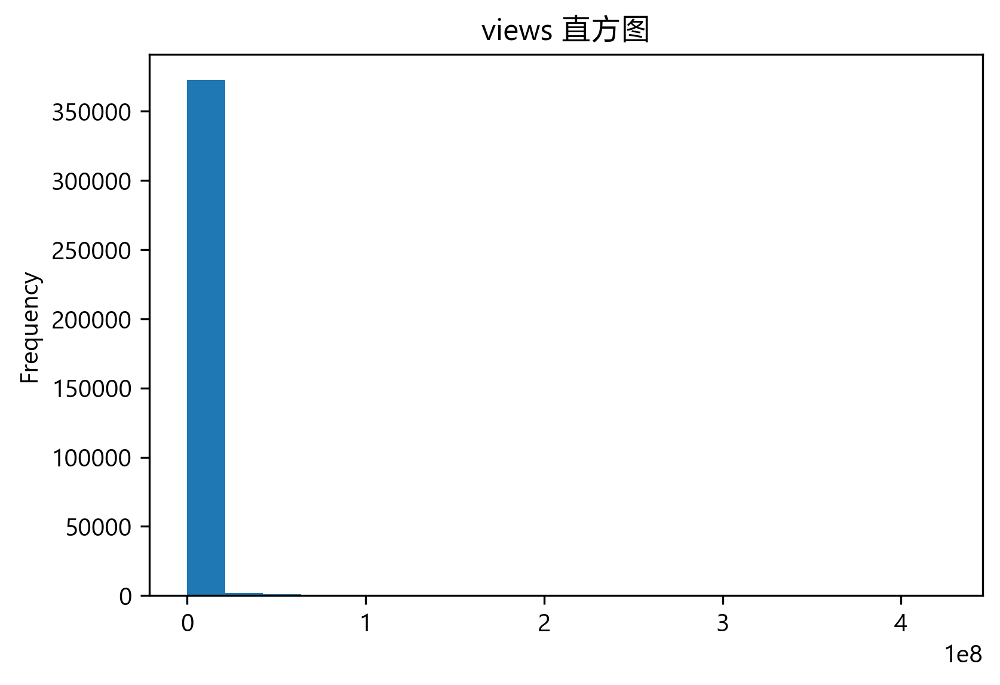

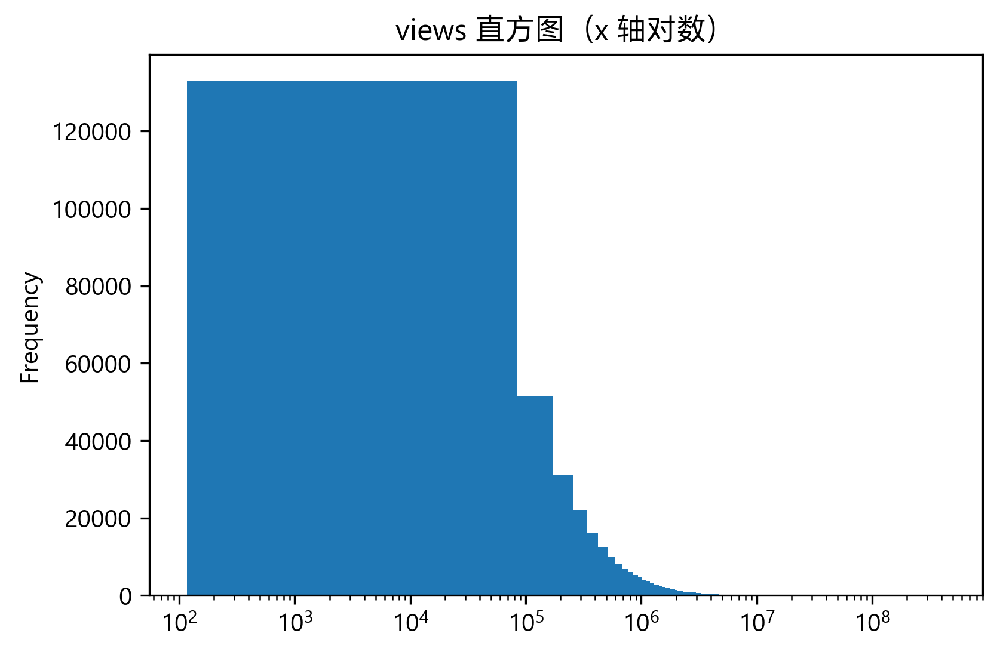

In [61]:
data_ytb_concatted.views.dropna().plot.hist(bins = 20, title = 'views 直方图')
plt.show()
data_ytb_concatted.views.dropna().plot.hist(bins = 5000, title = 'views 直方图（x 轴对数）', logx = True)

- `likes` 直方图

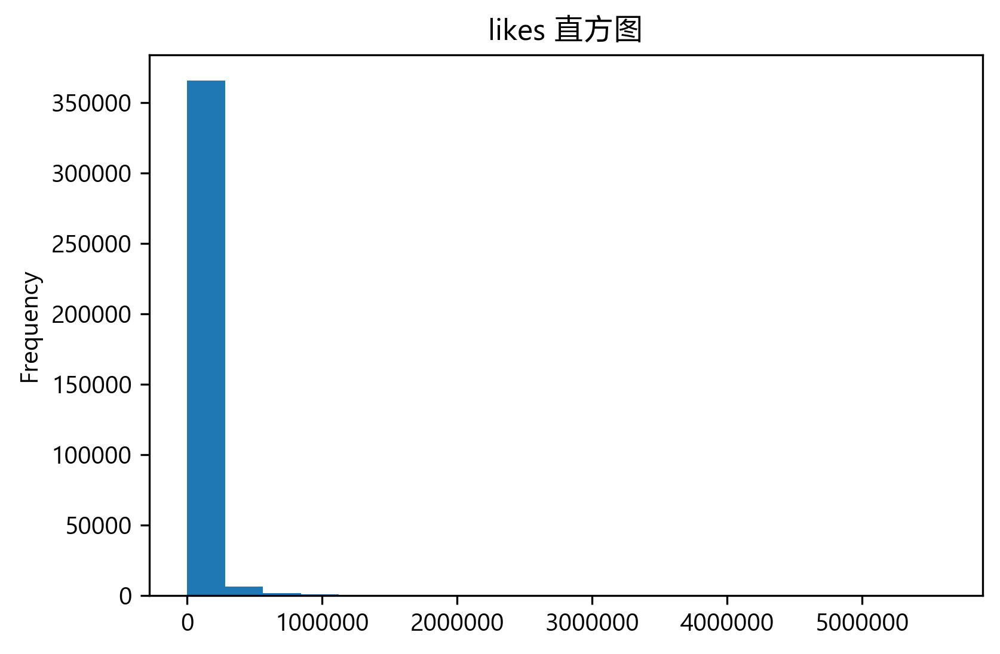

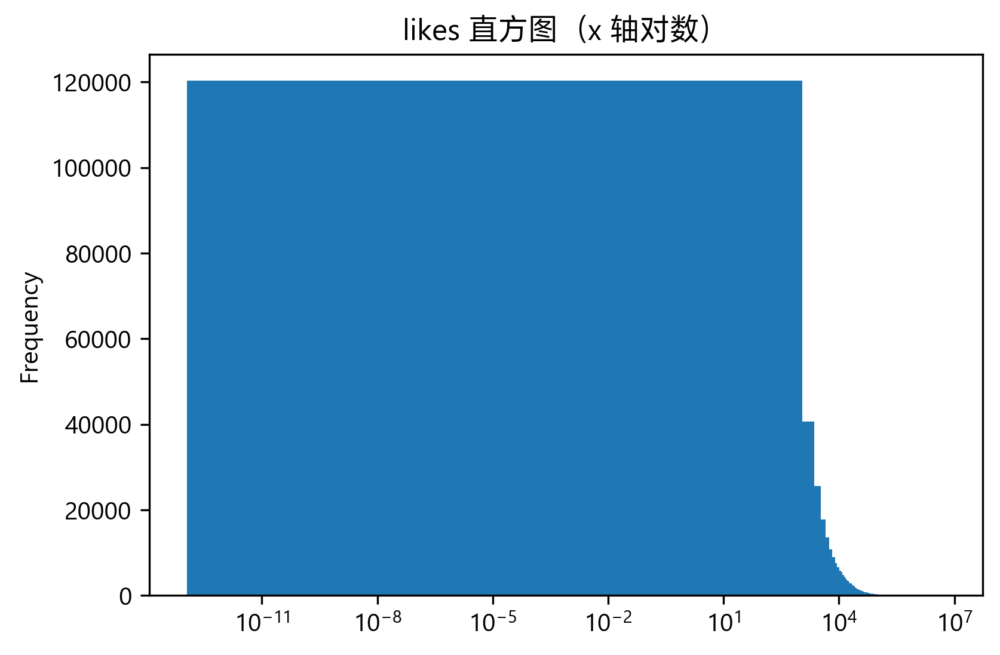

In [62]:
data_ytb_concatted.likes.dropna().plot.hist(bins = 20, title = 'likes 直方图')
plt.show()
data_ytb_concatted.likes.dropna().plot.hist(bins = 5000, title = 'likes 直方图（x 轴对数）', logx = True)

- `dislikes` 直方图

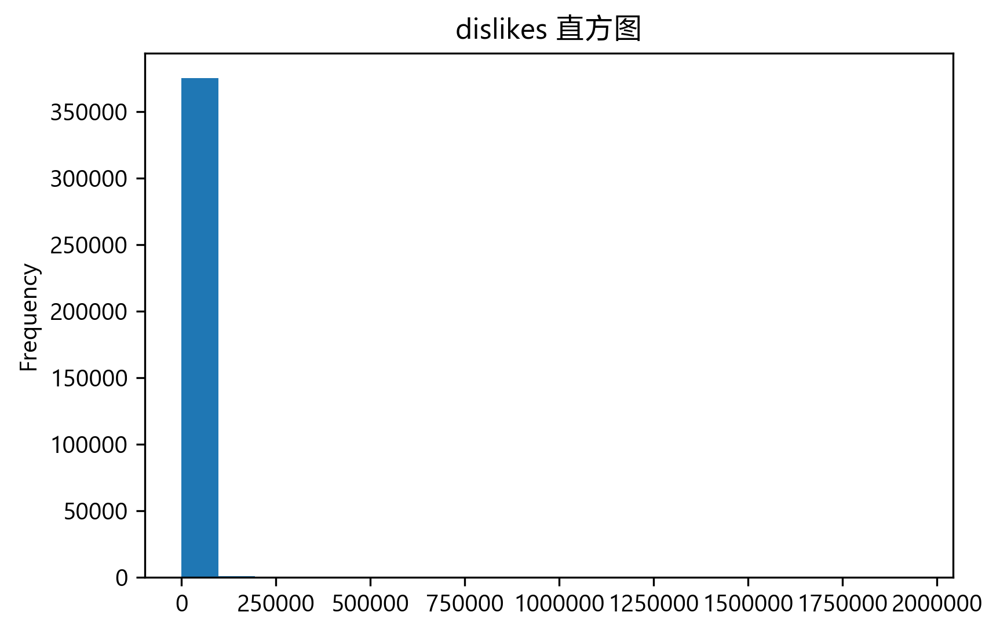

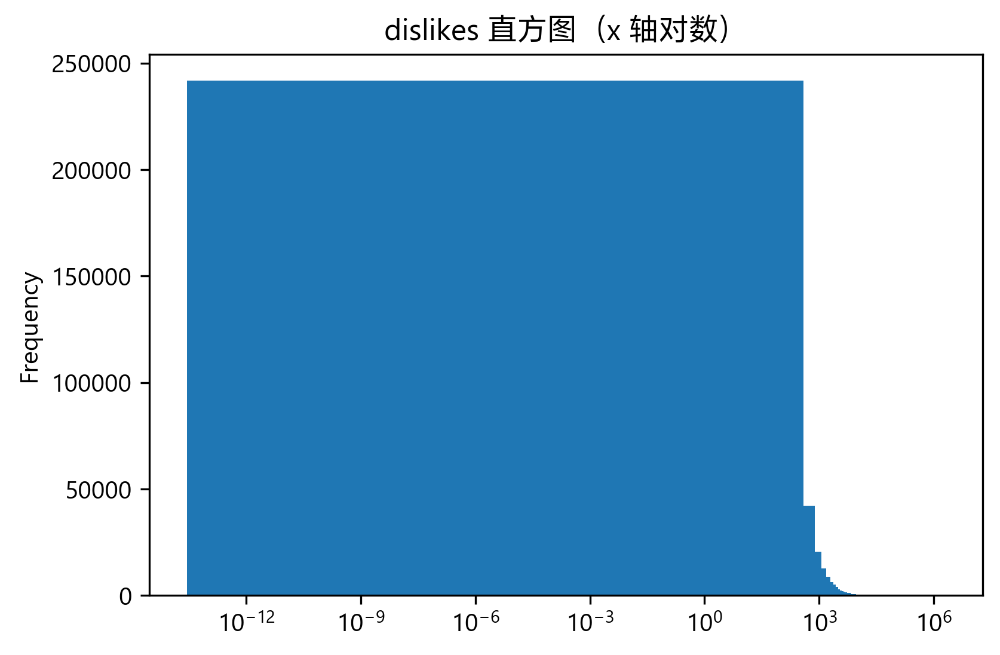

In [63]:
data_ytb_concatted.dislikes.dropna().plot.hist(bins = 20, title = 'dislikes 直方图')
plt.show()
data_ytb_concatted.dislikes.dropna().plot.hist(bins = 5000, title = 'dislikes 直方图（x 轴对数）', logx = True)

#### 2.2.2 盒图
- `views` 盒图

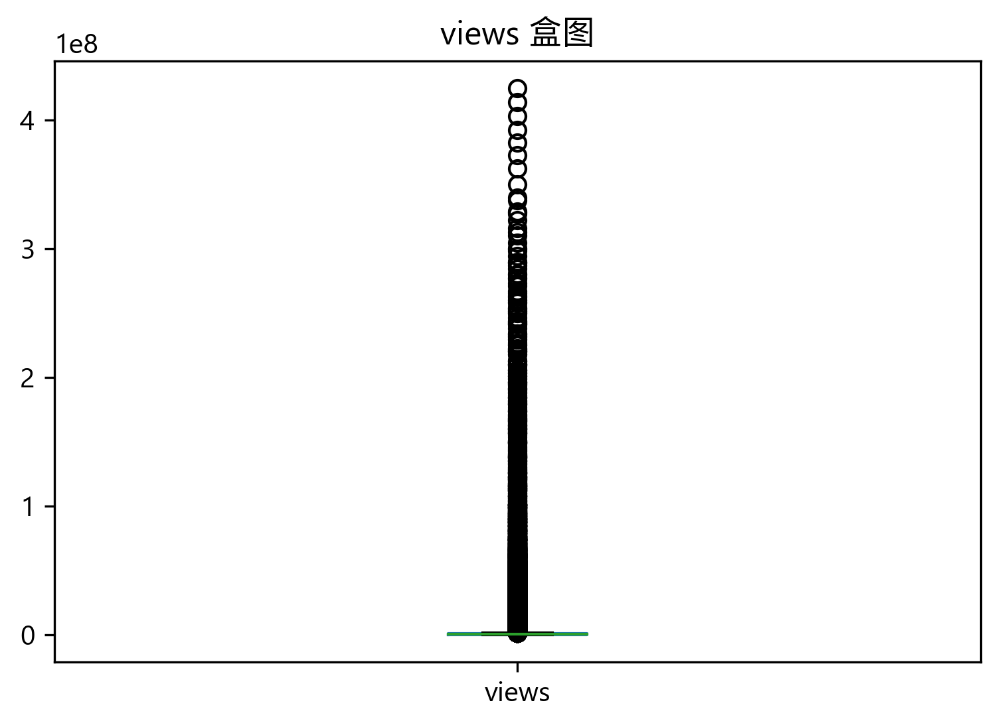

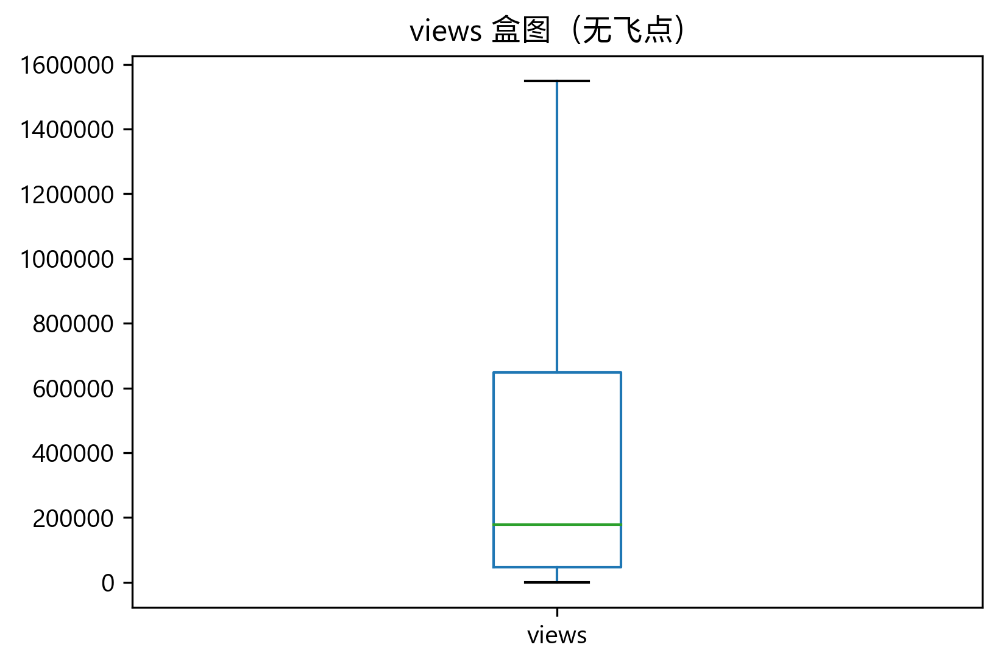

In [65]:
data_ytb_concatted.views.dropna().plot.box(title = 'views 盒图')
plt.show()
data_ytb_concatted.views.dropna().plot.box(title = 'views 盒图（无飞点）', showfliers = False)

- `likes` 盒图

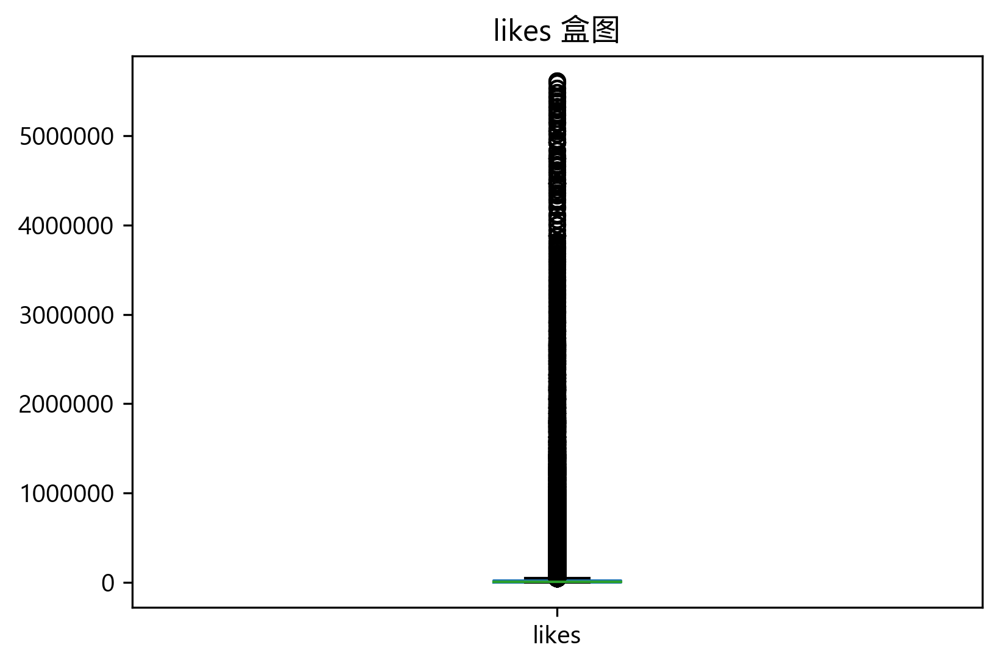

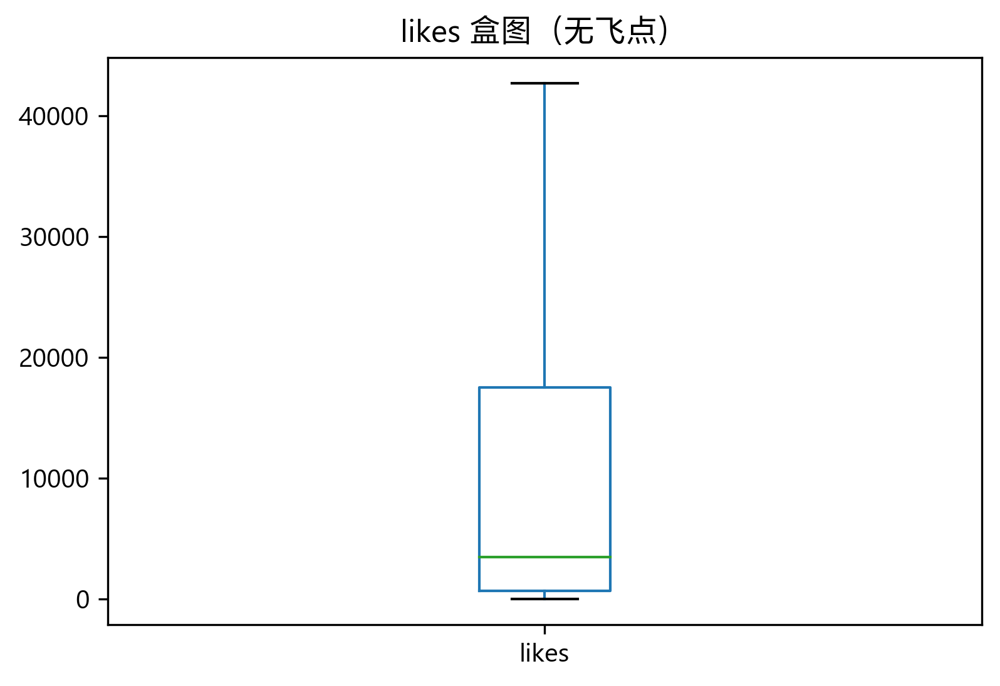

In [66]:
data_ytb_concatted.likes.dropna().plot.box(title = 'likes 盒图')
plt.show()
data_ytb_concatted.likes.dropna().plot.box(title = 'likes 盒图（无飞点）', showfliers = False)

- `dislikes` 盒图

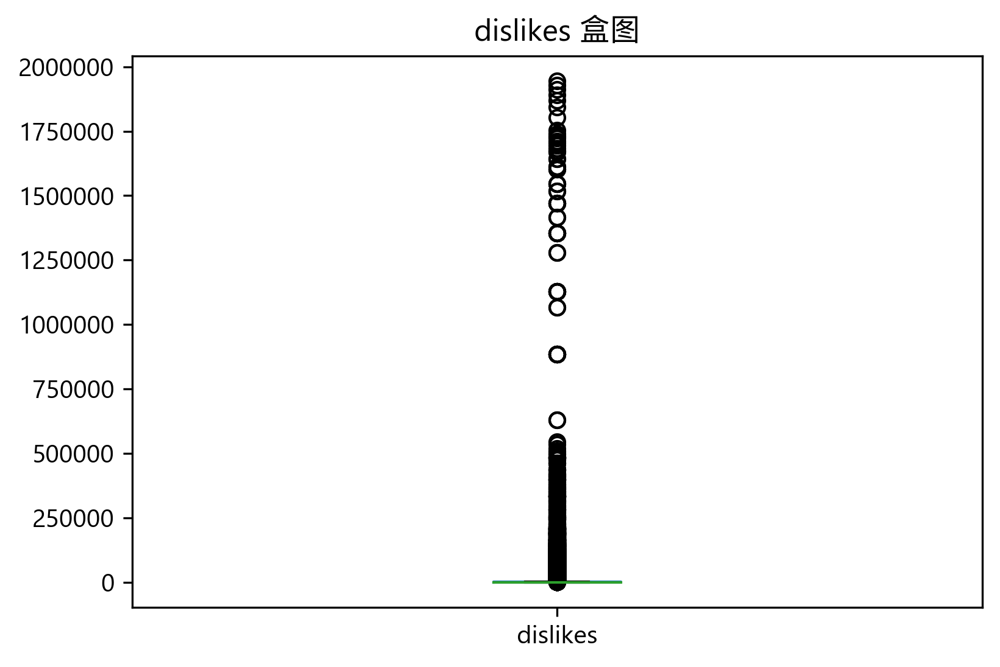

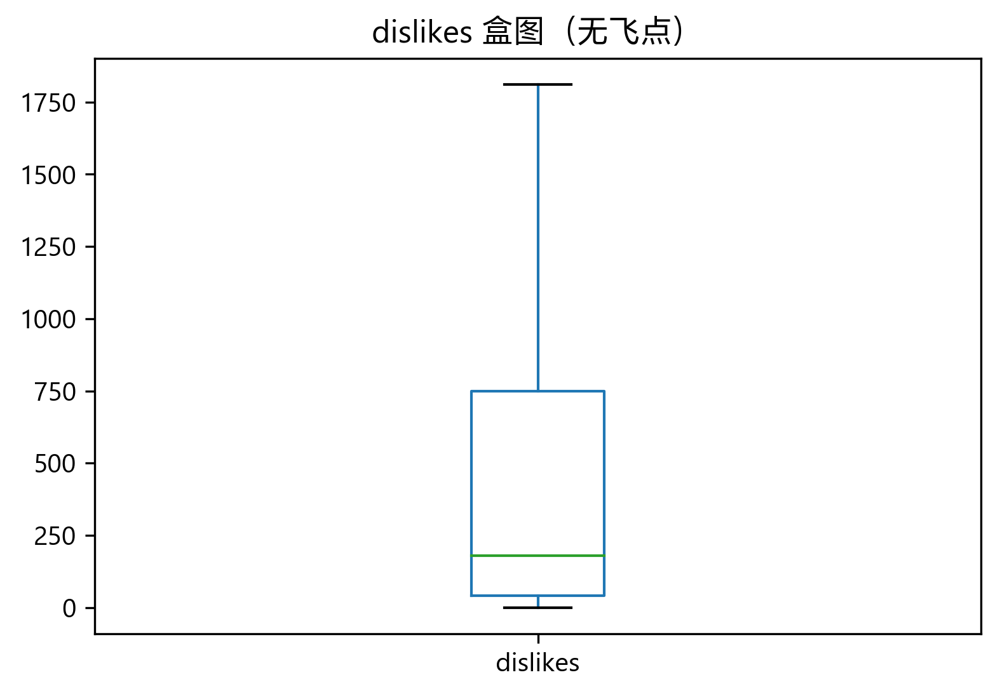

In [67]:
data_ytb_concatted.dislikes.dropna().plot.box(title = 'dislikes 盒图')
plt.show()
data_ytb_concatted.dislikes.dropna().plot.box(title = 'dislikes 盒图（无飞点）', showfliers = False)

### 2.2 缺失数据的处理

Youtube 数据集中的几个数值属性均没有缺失值。